# Imports

In [1]:
import os, warnings
import time

import pandas as pd
import numpy as np

from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report, precision_recall_curve, make_scorer
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC, SVC
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.kernel_ridge import KernelRidge
from sklearn.neural_network import MLPClassifier


from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
#from imblearn.pipeline import Pipeline


import lime
import lime.lime_tabular

import shap



import matplotlib.pyplot as plt
import seaborn as sns

# Options

In [2]:
warnings.filterwarnings('ignore')


In [3]:
path="input/cleaned/"
filename = "df_cleaned.csv"

In [4]:
original_df = pd.read_csv(path + filename)


In [5]:
sample_size = 20000

class_0_proportion = 0.919
class_1_proportion = 0.081

n_class_0 = int(sample_size * class_0_proportion)
n_class_1 = int(sample_size * class_1_proportion)

df_class_0 = original_df[original_df['TARGET'] == 0].sample(n=n_class_0, random_state=42)
df_class_1 = original_df[original_df['TARGET'] == 1].sample(n=n_class_1, random_state=42)

df = pd.concat([df_class_0, df_class_1])

df= df.sample(frac=1, random_state=42).reset_index(drop=True)

df

,AMT_CREDIT,AMT_GOODS_PRICE,CODE_GENDER_F,CODE_GENDER_M,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_ANOM,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,...,AGE_EXT_EXT_SOURCE_1,AGE_EXT_EXT_SOURCE_2,AGE_EXT_EXT_SOURCE_3,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,EXT_SOURCE_2 EXT_SOURCE_3,EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3,EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH,EXT_SOURCE_2^2 EXT_SOURCE_3,EXT_SOURCE_2 EXT_SOURCE_3^2
0,134775.0,112500.0,False,True,22776.0,-1648.0,True,-5277.0,0.0,-6562.0,...,-31.574271,-14.549208,-52.577571,2.495833,22.218101,0.196458,0.099408,4474.537390,0.045806,0.165534
1,675000.0,675000.0,True,False,22202.0,-4192.0,False,-4204.0,-767.0,-4015.0,...,-54.072160,-47.799315,-53.861954,10.714286,33.975085,0.695833,0.618557,15448.894597,0.546799,0.616152
2,585000.0,585000.0,True,False,12799.0,-3316.0,False,-1385.0,-273.0,-2366.0,...,-17.743199,-25.207148,-2.699518,0.962963,20.000000,0.055341,0.028002,708.303994,0.039782,0.004260
3,463626.0,387000.0,False,True,14767.0,-514.0,False,-4115.0,-1724.0,-8805.0,...,-20.471429,-26.313658,-21.655957,2.943657,19.479675,0.348145,0.176160,5141.052749,0.226434,0.186354
4,1479973.5,1381500.0,True,False,16760.0,-2673.0,False,-288.0,-3603.0,-10795.0,...,-26.211135,-33.345362,-24.578712,3.654256,24.179018,0.388716,0.221890,6514.877763,0.282284,0.208070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,276277.5,238500.0,True,False,12116.0,-883.0,False,-4169.0,0.0,-4212.0,...,-16.796359,-20.931692,-7.183393,1.364333,12.844142,0.136459,0.069048,1653.333264,0.086048,0.029530
19996,229500.0,229500.0,False,True,10388.0,-1000.0,False,-1564.0,-307.0,-4979.0,...,-14.400840,-20.066502,-8.032868,1.457143,12.658228,0.199005,0.100696,2067.264671,0.140313,0.056169
19997,225000.0,225000.0,True,False,15264.0,-6806.0,False,-4146.0,-2355.0,-4148.0,...,-21.160418,-26.472738,-12.111304,2.000000,20.316944,0.183332,0.092766,2798.382938,0.116055,0.053095
19998,444420.0,337500.0,True,False,14963.0,-2223.0,False,-4149.0,-640.0,-4031.0,...,-5.429288,-10.330647,-22.749777,1.936471,19.475449,0.139847,0.018521,2092.530094,0.035242,0.077608


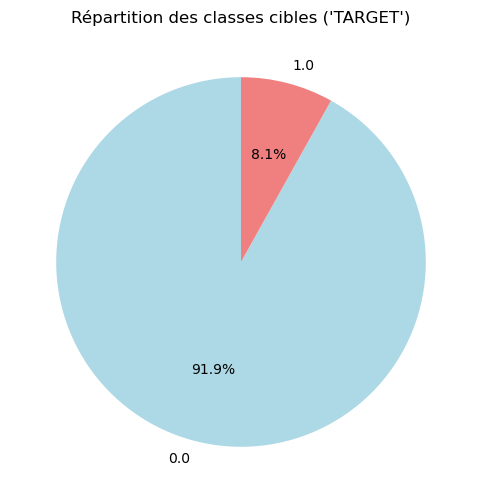

In [6]:
target_counts = df['TARGET'].value_counts()

plt.figure(figsize=(6, 6))
target_counts = df['TARGET'].value_counts()
plt.pie(target_counts, labels=target_counts.index, autopct='%1.1f%%', startangle=90, colors=['lightblue', 'lightcoral'])
plt.title("Répartition des classes cibles ('TARGET')")
plt.show()

In [7]:
df.shape

(20000, 62)

# Data preparation

## X & y

In [8]:
pipelines = []

In [9]:
scaler = MinMaxScaler(feature_range = (0, 1))

features = list(df.columns)

scaler.fit(df)
train = scaler.fit_transform(df)

df = pd.DataFrame(train, columns=features)

In [10]:
df.head()

,AMT_CREDIT,AMT_GOODS_PRICE,CODE_GENDER_F,CODE_GENDER_M,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_ANOM,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,...,AGE_EXT_EXT_SOURCE_1,AGE_EXT_EXT_SOURCE_2,AGE_EXT_EXT_SOURCE_3,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,EXT_SOURCE_2 EXT_SOURCE_3,EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3,EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH,EXT_SOURCE_2^2 EXT_SOURCE_3,EXT_SOURCE_2 EXT_SOURCE_3^2
0,0.027478,0.021739,0.0,1.0,0.862629,0.906230,1.0,0.157702,1.000000,0.691185,...,0.518310,0.730317,0.111942,0.086159,0.450806,0.278753,0.160707,0.272870,0.081389,0.266141
1,0.192828,0.202899,1.0,0.0,0.829829,0.761215,0.0,0.328970,0.807673,0.811050,...,0.168237,0.113954,0.090243,0.390171,0.784282,0.987326,1.000000,0.942122,0.971557,0.990636
2,0.165281,0.173913,1.0,0.0,0.292514,0.811150,0.0,0.778931,0.931545,0.888654,...,0.733525,0.532749,0.954605,0.029456,0.387891,0.078519,0.045268,0.043193,0.070685,0.006850
3,0.128131,0.110145,0.0,1.0,0.404971,0.970872,0.0,0.343176,0.567703,0.585628,...,0.691073,0.512237,0.634346,0.102725,0.373133,0.493984,0.284791,0.313516,0.402330,0.299615
4,0.439211,0.430435,1.0,0.0,0.518857,0.847803,0.0,0.954030,0.096540,0.491976,...,0.601762,0.381889,0.584968,0.129011,0.506425,0.551551,0.358720,0.397296,0.501565,0.334531


In [11]:
X = df.drop(columns="TARGET")
y = df.TARGET

In [12]:
X.head()

,AMT_CREDIT,AMT_GOODS_PRICE,CODE_GENDER_F,CODE_GENDER_M,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_ANOM,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,DAYS_REGISTRATION,...,AGE_EXT_EXT_SOURCE_1,AGE_EXT_EXT_SOURCE_2,AGE_EXT_EXT_SOURCE_3,CREDIT_INCOME_RATIO,CREDIT_ANNUITY_RATIO,EXT_SOURCE_2 EXT_SOURCE_3,EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3,EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH,EXT_SOURCE_2^2 EXT_SOURCE_3,EXT_SOURCE_2 EXT_SOURCE_3^2
0,0.027478,0.021739,0.0,1.0,0.862629,0.906230,1.0,0.157702,1.000000,0.691185,...,0.518310,0.730317,0.111942,0.086159,0.450806,0.278753,0.160707,0.272870,0.081389,0.266141
1,0.192828,0.202899,1.0,0.0,0.829829,0.761215,0.0,0.328970,0.807673,0.811050,...,0.168237,0.113954,0.090243,0.390171,0.784282,0.987326,1.000000,0.942122,0.971557,0.990636
2,0.165281,0.173913,1.0,0.0,0.292514,0.811150,0.0,0.778931,0.931545,0.888654,...,0.733525,0.532749,0.954605,0.029456,0.387891,0.078519,0.045268,0.043193,0.070685,0.006850
3,0.128131,0.110145,0.0,1.0,0.404971,0.970872,0.0,0.343176,0.567703,0.585628,...,0.691073,0.512237,0.634346,0.102725,0.373133,0.493984,0.284791,0.313516,0.402330,0.299615
4,0.439211,0.430435,1.0,0.0,0.518857,0.847803,0.0,0.954030,0.096540,0.491976,...,0.601762,0.381889,0.584968,0.129011,0.506425,0.551551,0.358720,0.397296,0.501565,0.334531


In [13]:
y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: TARGET, dtype: float64

## Test train split

In [14]:
X_train,X_test, y_train,y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [15]:
print(f"X_train de forme {X_train.shape} et y_train de forme {y_train.shape}")
print(f"X_testde forme {X_test.shape} et y_test de forme {y_test.shape}")

X_train de forme (14000, 61) et y_train de forme (14000,)
X_testde forme (6000, 61) et y_test de forme (6000,)


In [16]:
numeric_cols = X.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Modelisation
## Fonctions

In [17]:
sns.set(style="whitegrid")
custom_palette = ["lightblue", "lightcoral"]
sns.set_palette(custom_palette)

Affiche les scores de précision, le score AUC-ROC, la matrice de confusion et un rapport de classification.

In [18]:
def score(estimator, y_pred):
    tr_score = estimator.score(X_train, y_train).round(4)
    te_score = estimator.score(X_test, y_test).round(4)
    roc_auc = roc_auc_score(y_test, estimator.predict_proba(X_test)[:, 1]).round(4)

    print(f"Score d'entraînement : {tr_score}")
    print(f"Score de test : {te_score}")
    print(f"Score ROC AUC (Test) : {roc_auc}")

    print("\nMatrice de confusion :")
    mat = confusion_matrix(y_test, y_pred)
    mat = pd.DataFrame(mat)
    mat.columns = [f"préd_{i}" for i in mat.columns]
    mat.index = [f"test_{i}" for i in mat.index]
    print(mat)

    print("\nRapport de classification :")
    print(classification_report(y_test, y_pred, zero_division=0))



In [19]:
def create_score_metier(y_test, y_pred):
    fn, fp, tn, tp = confusion_matrix(y_test, y_pred).ravel()
    score = fp + 10 * fn
    return score

scorer_metier = make_scorer(create_score_metier, greater_is_better=False)

In [20]:
sns.set(style='whitegrid')

def plot_roc_auc(estimator):
    """Affiche la courbe ROC"""
    
    y_proba = estimator.predict_proba(X_test)[:, 1]
    
    fpr, tpr, thresholds = roc_curve(y_test, y_proba)
    auc_score = auc(fpr, tpr).round(4)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f"Courbe ROC (AUC = {auc_score})", color="lightblue", linewidth=2)
    plt.plot([0, 1], [0, 1], color="lightcoral", linestyle="--", linewidth=2)
    
    plt.xlabel("Taux faux positifs", fontsize=12)
    plt.ylabel("Taux vrais positifs", fontsize=12)
    plt.title("Courbe ROC", fontsize=16)
    plt.legend(loc="lower right")
    plt.show()


Affiche les temps d'entraînement, de prédiction, ainsi que le score AUC et les taux de faux positifs et négatifs.
Affiche également les meilleurs paramètres trouvés si RandomizedSearchCV est utilisé.

In [21]:
model_results = []

def evaluate_model(pipeline, model_name, clf):
    model_info = {"Model": model_name}
    
    start_time = time.time()
    pipeline.fit(X_train, y_train)
    train_time = time.time() - start_time
    model_info["TrainingTime"] = train_time

    start_time = time.time()
    y_pred = pipeline.predict(X_test)
    predict_time = time.time() - start_time
    model_info["PredictTime"] = predict_time

    y_proba = pipeline.predict_proba(X_test)[:, 1]
    roc_auc = roc_auc_score(y_test, y_proba)
    model_info["AUC"] = roc_auc

    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    false_positive_rate = fp / (fp + tn) * 100
    false_negative_rate = fn / (fn + tp) * 100

    model_info["FalsePositive"] = false_positive_rate
    model_info["FalseNegative"] = false_negative_rate

    model_info["Pipeline"] = pipeline
    model_info["clf"] = clf
    score_metier = create_score_metier(y_test, y_pred)
    model_info["ScoreMetier"] = score_metier
    model_results.append(model_info)

    print(f"Modèle : {model_name}, AUC : {roc_auc:.4f}, Score Metier : {score_metier:.4f}, Temps d'entraînement : {train_time:.4f} secondes, Temps de prédiction : {predict_time:.4f} secondes")

    score(pipeline, y_pred)
    plot_roc_auc(pipeline)

    if hasattr(pipeline, 'best_params_'):
        print("\nMeilleurs paramètres trouvés :")
        best_params = pipeline.best_params_
        best_params_df = pd.DataFrame(list(best_params.items()), columns=["Params", "BestValues"])
        print(best_params_df)

    return y_pred, y_proba


## Dummy Classifier

Modèle : Dummy Classifier, AUC : 0.5000, Score Metier : 55230.0000, Temps d'entraînement : 0.0020 secondes, Temps de prédiction : 0.0000 secondes
Score d'entraînement : 0.9184
Score de test : 0.9205
Score ROC AUC (Test) : 0.5

Matrice de confusion :
        préd_0  préd_1
test_0    5523       0
test_1     477       0

Rapport de classification :
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96      5523
         1.0       0.00      0.00      0.00       477

    accuracy                           0.92      6000
   macro avg       0.46      0.50      0.48      6000
weighted avg       0.85      0.92      0.88      6000



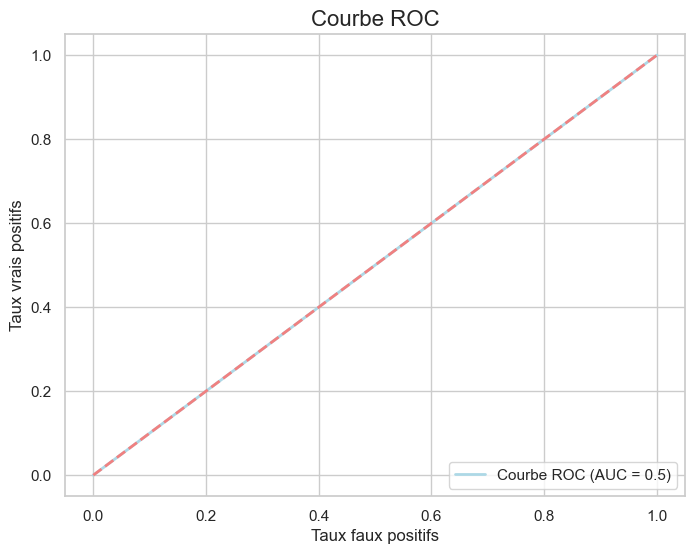

(array([0., 0., 0., ..., 0., 0., 0.]), array([0., 0., 0., ..., 0., 0., 0.]))

In [22]:
pipeline = Pipeline(steps=[
    ('classifier', DummyClassifier(strategy='most_frequent'))
])

clf = DummyClassifier(strategy='most_frequent')

evaluate_model(pipeline, "Dummy Classifier", clf)

Le modèle ne peut pas différencier les classes positives des classes négatives.

## Logistic Regression

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Modèle : Régression Logistique avec SMOTE et RandomizedSearchCV, AUC : 0.7416, Score Metier : 38382.0000, Temps d'entraînement : 13.5406 secondes, Temps de prédiction : 0.0030 secondes
Score d'entraînement : -89375
Score de test : -38382
Score ROC AUC (Test) : 0.7416

Matrice de confusion :
        préd_0  préd_1
test_0    3651    1872
test_1     146     331

Rapport de classification :
              precision    recall  f1-score   support

         0.0       0.96      0.66      0.78      5523
         1.0       0.15      0.69      0.25       477

    accuracy                           0.66      6000
   macro avg       0.56      0.68      0.52      6000
weighted avg       0.90      0.66      0.74      6000



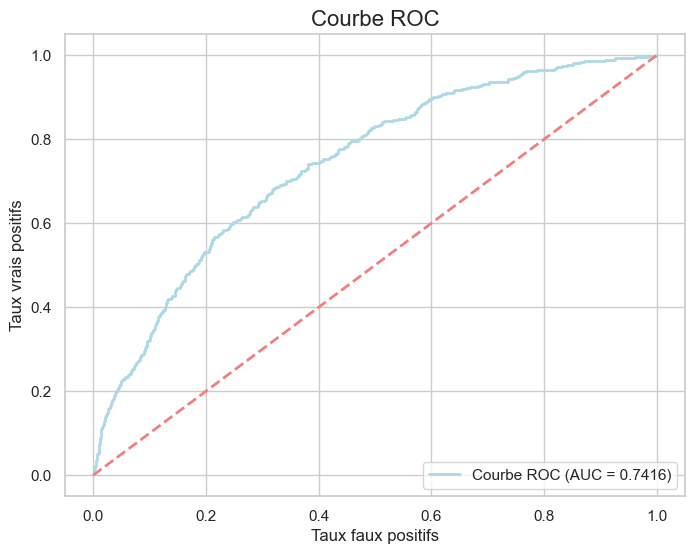


Meilleurs paramètres trouvés :
                 Params BestValues
0    classifier__solver      lbfgs
1   classifier__penalty         l2
2  classifier__max_iter        300
3         classifier__C     0.0001


(array([0., 0., 0., ..., 1., 0., 1.]),
 array([0.42377743, 0.45738276, 0.46109288, ..., 0.50505899, 0.31692501,
        0.53443409]))

In [23]:
param_grid = {
    'classifier__C': np.logspace(-4, 4, 20),
    'classifier__penalty': ['l2'],
    'classifier__solver': ['lbfgs', 'liblinear'],
    'classifier__max_iter': [100, 200, 300]
}

pipeline = ImbPipeline(steps=[
    ('preprocessor', StandardScaler()),
    ('smote', SMOTE(random_state=42)),
    ('classifier', LogisticRegression(random_state=42))
])

clf = LogisticRegression()

random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_grid,
    n_iter=10,
    scoring={'roc_auc': 'roc_auc', 'score_metier': scorer_metier},
    refit='score_metier',
    cv=5,
    random_state=42,
    verbose=1,
    n_jobs=-1
)

evaluate_model(random_search, "Régression Logistique avec SMOTE et RandomizedSearchCV", clf)


Le modèle a une  difficulté à classer correctement la classe 1.

## SVM

Modèle : SVM avec SMOTE, Random Search et Validation Croisée, AUC : 0.6787, Score Metier : 37617.0000, Temps d'entraînement : 1903.4900 secondes, Temps de prédiction : 3.9361 secondes
Score d'entraînement : -90815
Score de test : -37617
Score ROC AUC (Test) : 0.6787

Matrice de confusion :
        préd_0  préd_1
test_0    3566    1957
test_1     193     284

Rapport de classification :
              precision    recall  f1-score   support

         0.0       0.95      0.65      0.77      5523
         1.0       0.13      0.60      0.21       477

    accuracy                           0.64      6000
   macro avg       0.54      0.62      0.49      6000
weighted avg       0.88      0.64      0.72      6000



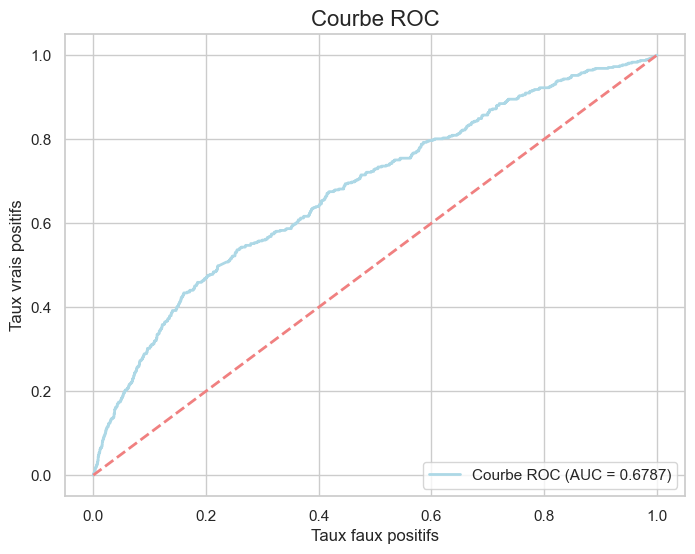


Meilleurs paramètres trouvés :
               Params BestValues
0  classifier__kernel       poly
1   classifier__gamma       auto
2  classifier__degree          4
3       classifier__C        0.1


(array([0., 1., 0., ..., 0., 0., 1.]),
 array([3.22222288e-04, 5.00000000e-01, 2.75924813e-01, ...,
        3.28222001e-01, 2.96838228e-02, 5.46059601e-01]))

In [24]:
param_grid = {
    'classifier__C': np.logspace(-3, 3, 10),
    'classifier__gamma': ['scale', 'auto'],
    'classifier__kernel': ['rbf', 'poly'],
    'classifier__degree': [2, 3, 4]
}

pipeline = ImbPipeline(steps=[
    ('preprocessor', StandardScaler()),
    ('smote', SMOTE(random_state=42)),
    ('classifier', SVC(probability=True, random_state=42))
])

clf = SVC()

cv_folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

svm = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_grid,
    n_iter=10,
    scoring={'roc_auc': 'roc_auc', 'score_metier': scorer_metier},
    refit='score_metier',
    cv=cv_folds,
    random_state=42,
    n_jobs=-1
)

evaluate_model(svm, "SVM avec SMOTE, Random Search et Validation Croisée", clf)


## MLP Classifier

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Modèle : MLP CLlassifier avec SMOTE et RandomizedSearchCV, AUC : 0.6317, Score Metier : 48759.0000, Temps d'entraînement : 115.7930 secondes, Temps de prédiction : 0.0130 secondes
Score d'entraînement : -119759
Score de test : -48759
Score ROC AUC (Test) : 0.6317

Matrice de confusion :
        préd_0  préd_1
test_0    4804     719
test_1     354     123

Rapport de classification :
              precision    recall  f1-score   support

         0.0       0.93      0.87      0.90      5523
         1.0       0.15      0.26      0.19       477

    accuracy                           0.82      6000
   macro avg       0.54      0.56      0.54      6000
weighted avg       0.87      0.82      0.84      6000



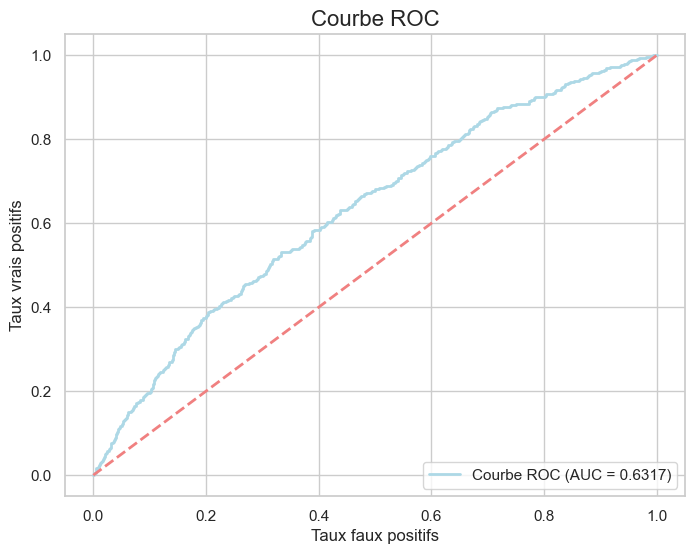


Meilleurs paramètres trouvés :
                           Params BestValues
0       classifier__learning_rate   adaptive
1  classifier__hidden_layer_sizes   (50, 50)
2               classifier__alpha       0.01


(array([0., 0., 0., ..., 0., 0., 1.]),
 array([9.11647519e-05, 1.17451795e-02, 6.53127066e-04, ...,
        3.22921669e-02, 5.30158703e-07, 7.33585187e-01]))

In [25]:
pipeline = ImbPipeline(steps=[
    ('smote', SMOTE(random_state=42)),
    ('classifier',  MLPClassifier(random_state=42))
])

param_grid = {
    'classifier__hidden_layer_sizes': [(100,), (50, 50), (100, 100)],
    'classifier__alpha': [0.0001, 0.001, 0.01],
    'classifier__learning_rate': ['constant', 'adaptive']
}

clf =  MLPClassifier(random_state=42)

cv_folds = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

mlpclass = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_grid,
    n_iter=10,
    scoring={'roc_auc': 'roc_auc', 'score_metier': scorer_metier},
    refit='score_metier',
    cv=cv_folds,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

evaluate_model(mlpclass, "MLP CLlassifier avec SMOTE et RandomizedSearchCV", clf)

## Gradient Boost


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Modèle : Gradient Boosting avec SMOTE et RandomizedSearchCV, AUC : 0.7156, Score Metier : 36870.0000, Temps d'entraînement : 151.5375 secondes, Temps de prédiction : 0.0060 secondes
Score d'entraînement : -86792
Score de test : -36870
Score ROC AUC (Test) : 0.7156

Matrice de confusion :
        préd_0  préd_1
test_0    3483    2040
test_1     142     335

Rapport de classification :
              precision    recall  f1-score   support

         0.0       0.96      0.63      0.76      5523
         1.0       0.14      0.70      0.23       477

    accuracy                           0.64      6000
   macro avg       0.55      0.67      0.50      6000
weighted avg       0.90      0.64      0.72      6000



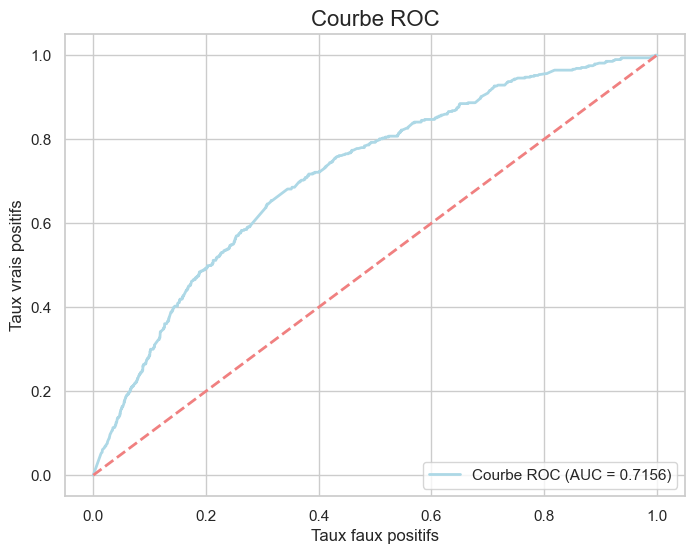


Meilleurs paramètres trouvés :
                      Params  BestValues
0      classifier__subsample        0.70
1   classifier__n_estimators       50.00
2      classifier__max_depth        3.00
3  classifier__learning_rate        0.01


(array([0., 0., 1., ..., 0., 0., 1.]),
 array([0.43900993, 0.45274292, 0.50341798, ..., 0.40729332, 0.37790712,
        0.50588393]))

In [26]:
pipeline = ImbPipeline(steps=[
    ('smote', SMOTE(random_state=42)),
    ('classifier', GradientBoostingClassifier())
])

param_grid = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__learning_rate': [0.01, 0.1, 1.0],
    'classifier__max_depth': [3, 4, 5],
    'classifier__subsample': [0.7, 0.8, 0.9]
}

clf = GradientBoostingClassifier(n_estimators=100)

cv_folds = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_grid,
    n_iter=10,
    scoring={'roc_auc': 'roc_auc', 'score_metier': scorer_metier},
    refit='score_metier',
    cv=cv_folds,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

evaluate_model(random_search, "Gradient Boosting avec SMOTE et RandomizedSearchCV", clf)


# Random forest


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Modèle : Random Forest avec SMOTE et RandomizedSearchCV, AUC : 0.7012, Score Metier : 50199.0000, Temps d'entraînement : 80.2201 secondes, Temps de prédiction : 0.0888 secondes
Score d'entraînement : -125006
Score de test : -50199
Score ROC AUC (Test) : 0.7012

Matrice de confusion :
        préd_0  préd_1
test_0    4964     559
test_1     345     132

Rapport de classification :
              precision    recall  f1-score   support

         0.0       0.94      0.90      0.92      5523
         1.0       0.19      0.28      0.23       477

    accuracy                           0.85      6000
   macro avg       0.56      0.59      0.57      6000
weighted avg       0.88      0.85      0.86      6000



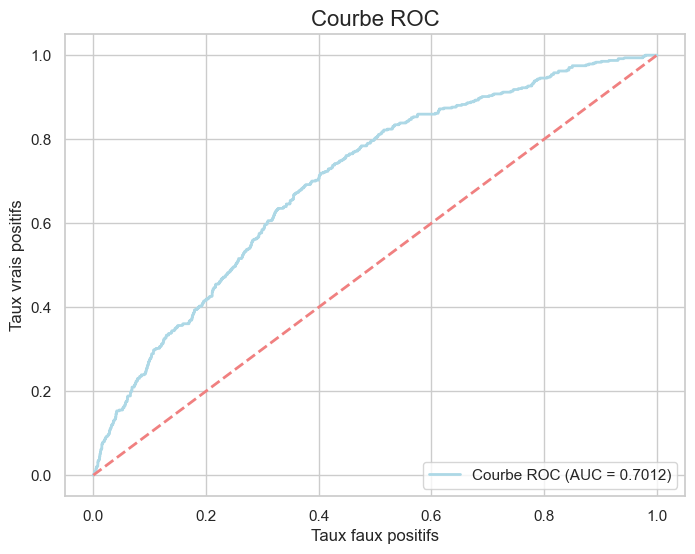


Meilleurs paramètres trouvés :
                             Params BestValues
0          smote__sampling_strategy        1.0
1       random_forest__n_estimators        100
2  random_forest__min_samples_split          2
3   random_forest__min_samples_leaf          2
4          random_forest__max_depth         20
5          random_forest__bootstrap       True


In [27]:
param_grid_rf = {
    'smote__sampling_strategy': [0.5, 1.0],
    'random_forest__n_estimators': [50, 100, 200],
    'random_forest__max_depth': [10, 20, 30, None],
    'random_forest__min_samples_split': [2, 5, 10],
    'random_forest__min_samples_leaf': [1, 2, 4],
    'random_forest__bootstrap': [True, False]
}

pipeline_rf = ImbPipeline(steps=[
    ('smote', SMOTE(random_state=42)),
    ('random_forest', RandomForestClassifier(random_state=42))
])

clf = RandomForestClassifier(n_estimators=100)
cv_folds = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

random_search_rf = RandomizedSearchCV(
    pipeline_rf, 
    param_distributions=param_grid_rf, 
    n_iter=10, 
    cv=cv_folds, 
    scoring={'roc_auc': 'roc_auc', 'score_metier': scorer_metier},
    refit='score_metier', 
    verbose=2, 
    random_state=42, 
    n_jobs=-1)

y_pred_rf, y_proba_rf = evaluate_model(random_search_rf, "Random Forest avec SMOTE et RandomizedSearchCV", clf)


Recupere les meilleurs parametres de l'etape precedente. Selectionne le meilleur poids de classe en se basant sur l'AUC.

Fitting 3 folds for each of 9 candidates, totalling 27 fits
Modèle : Random Forest avec Class Weight, AUC : 0.6690, Score Metier : 35853.0000, Temps d'entraînement : 72.1567 secondes, Temps de prédiction : 0.0768 secondes
Score d'entraînement : -89375
Score de test : -35853
Score ROC AUC (Test) : 0.669

Matrice de confusion :
        préd_0  préd_1
test_0    3370    2153
test_1     172     305

Rapport de classification :
              precision    recall  f1-score   support

         0.0       0.95      0.61      0.74      5523
         1.0       0.12      0.64      0.21       477

    accuracy                           0.61      6000
   macro avg       0.54      0.62      0.48      6000
weighted avg       0.89      0.61      0.70      6000



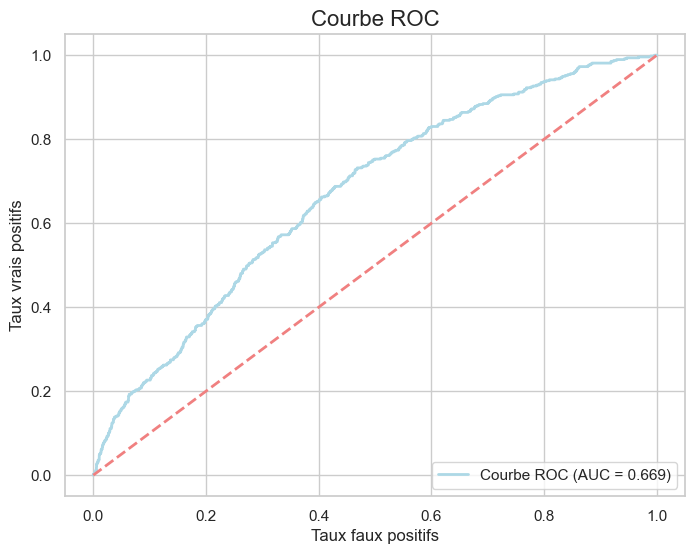


Meilleurs paramètres trouvés :
                        Params      BestValues
0  random_forest__class_weight  {0: 0.1, 1: 1}


In [28]:
best_params_rf = random_search_rf.best_params_

param_grid_weight = {
    'random_forest__class_weight': [
        {0: 0.1, 1: 1},
        {0: 0.3, 1: 1},
        {0: 0.5, 1: 1},
        {0: 0.7, 1: 1},
        {0: 0.8, 1: 1},
        {0: 1, 1: 1},
        {0: 1, 1: 2},
        {0: 1, 1: 2.5},
        {0: 0.3, 1: 3}
    ]
}

pipeline_weight = ImbPipeline(steps=[
    ('smote', SMOTE(random_state=42)),
    ('random_forest', RandomForestClassifier(
        n_estimators=best_params_rf['random_forest__n_estimators'],
        max_depth=best_params_rf['random_forest__max_depth'],
        min_samples_split=best_params_rf['random_forest__min_samples_split'],
        min_samples_leaf=best_params_rf['random_forest__min_samples_leaf'],
        bootstrap=best_params_rf['random_forest__bootstrap'],
        random_state=42
    ))
])

clf = RandomForestClassifier(n_estimators=100)
cv_folds = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
grid_search_weight = GridSearchCV(
    pipeline_weight, 
    param_grid=param_grid_weight, 
    cv=cv_folds, 
    scoring={'roc_auc': 'roc_auc', 'score_metier': scorer_metier},
    refit='score_metier',  
    verbose=2,
    n_jobs=-1)

y_pred_weighted, y_proba_weighted = evaluate_model(grid_search_weight, "Random Forest avec Class Weight", clf)


In [29]:
def score_metier(y_pred, y_test):
    fp = np.sum((y_pred == 1) & (y_test == 0))
    fn = np.sum((y_pred == 0) & (y_test == 1))
    return fp + 15*fn


On redefinit un score metier pour tenter de faire correspondre a la demande du client (les faux positifs, les clients qui sont décelés comme rembourser )

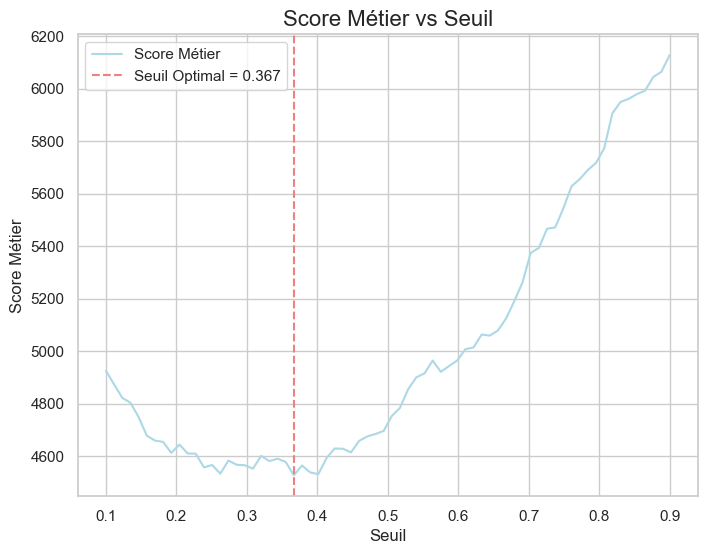

Seuil Optimal : 0.367
Matrice de Confusion avec Seuil Optimal:
[[2781 2742]
 [ 119  358]]

Rapport de Classification avec Seuil Optimal:
              precision    recall  f1-score   support

         0.0       0.96      0.50      0.66      5523
         1.0       0.12      0.75      0.20       477

    accuracy                           0.52      6000
   macro avg       0.54      0.63      0.43      6000
weighted avg       0.89      0.52      0.62      6000



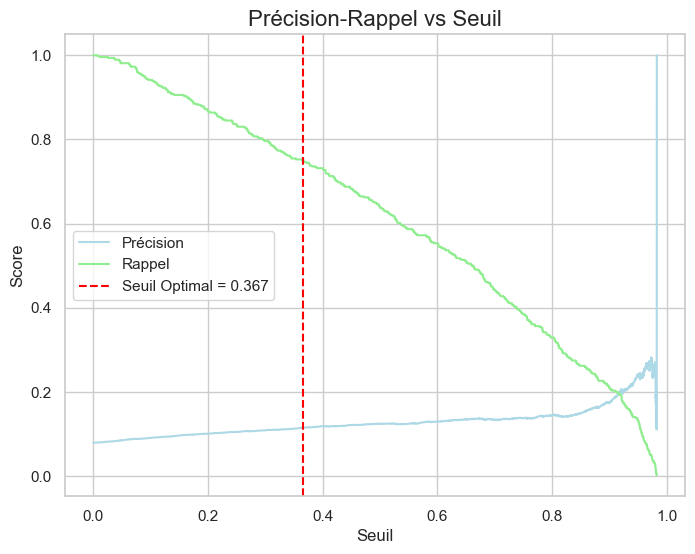

In [30]:
#Calcul du Score Métier + Recherche du Seuil Optimal
X_range = np.linspace(start=0.1, stop=0.9, num=70)
list_score_metier = []

for threshold in X_range:
    y_pred_threshold = (y_proba_weighted >= threshold).astype(int)
    score = score_metier(y_pred_threshold, y_test)
    list_score_metier.append(score)

plt.figure(figsize=(8, 6))
sns.lineplot(x=X_range, y=list_score_metier, color='lightblue', label='Score Métier')


optimal_threshold = X_range[np.argmin(list_score_metier)]
plt.axvline(optimal_threshold, color='lightcoral', linestyle='--', label=f'Seuil Optimal = {optimal_threshold:.3f}')

plt.title('Score Métier vs Seuil', fontsize=16)
plt.xlabel('Seuil', fontsize=12)
plt.ylabel('Score Métier', fontsize=12)
plt.legend(loc='best')
plt.show()

y_pred_optimal = (y_proba_weighted >= optimal_threshold).astype(int)

print(f"Seuil Optimal : {optimal_threshold:.3f}")

model_info = {"Model": "Random Forest avec Poids de Classe et Seuil Optimal"}
cm = confusion_matrix(y_test, y_pred_optimal)
tn, fp, fn, tp = cm.ravel()

false_positive_rate = fp / (fp + tn) * 100
false_negative_rate = fn / (fn + tp) * 100

model_info["FalsePositive"] = false_positive_rate
model_info["FalseNegative"] = false_negative_rate

score_metier = create_score_metier(y_test, y_pred_optimal)
model_info["ScoreMetier"] = score_metier

print("Matrice de Confusion avec Seuil Optimal:")
print(cm)

model_results.append(model_info)

print("\nRapport de Classification avec Seuil Optimal:")
print(classification_report(y_test, y_pred_optimal))

plt.figure(figsize=(8, 6))
precision, recall, thresholds = precision_recall_curve(y_test, y_proba_weighted)
plt.plot(thresholds, precision[:-1], label="Précision", color="lightblue")
plt.plot(thresholds, recall[:-1], label="Rappel", color="lightgreen")
plt.axvline(optimal_threshold, color='red', linestyle='--', label=f"Seuil Optimal = {optimal_threshold:.3f}")
plt.legend()

plt.title("Précision-Rappel vs Seuil", fontsize=16)
plt.xlabel("Seuil")
plt.ylabel("Score")
plt.show()


## Comparatif des modeles

Compare les scores AUC, les taux de faux positifs et faux négatifs, les temps d'entraînement et de prédiction  entre les modèles.

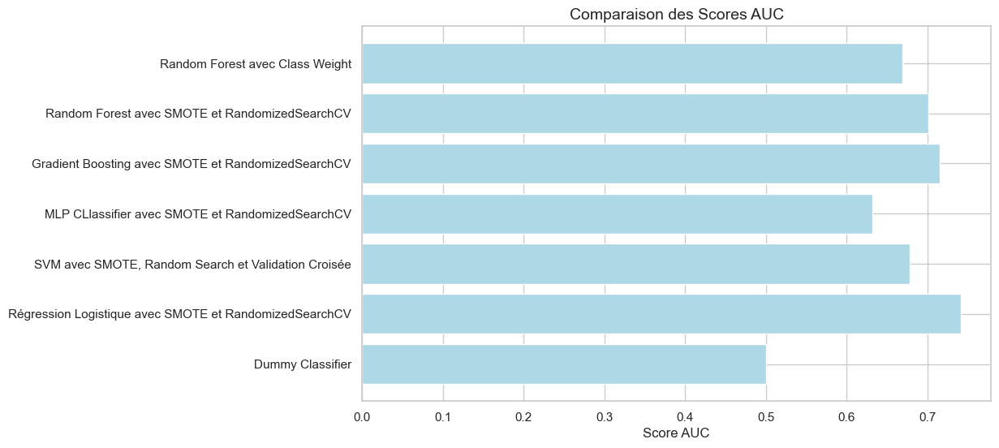

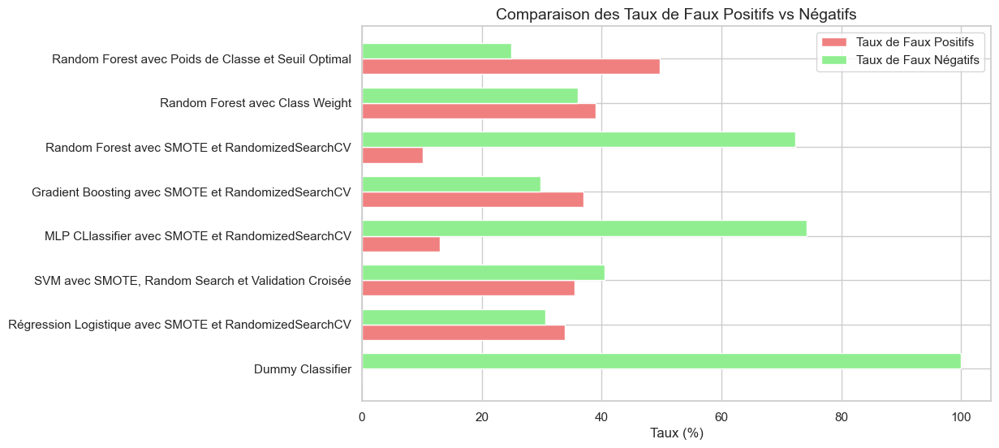

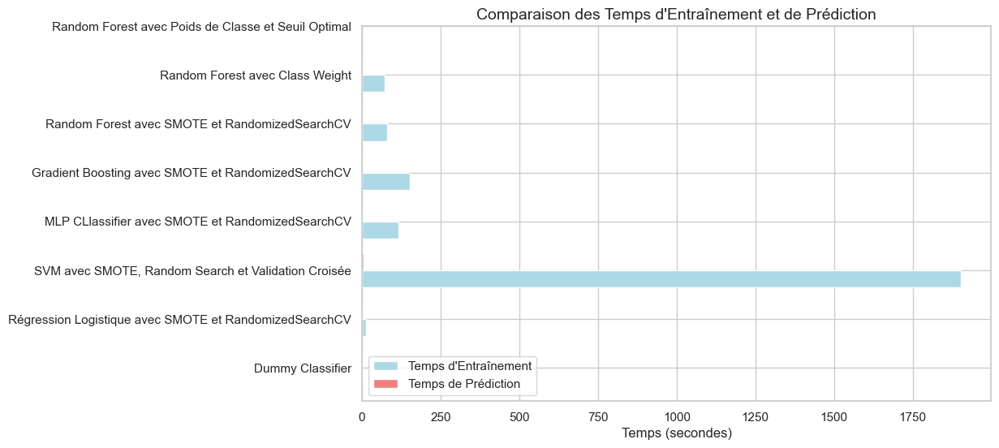

In [31]:
def plot_auc_score(results_df):
    plt.figure(figsize=(10, 6))
    plt.barh(results_df['Model'], results_df['AUC'], color='lightblue')
    plt.title('Comparaison des Scores AUC', fontsize=14)
    plt.xlabel('Score AUC', fontsize=12)
    plt.show()

def plot_false_positive_vs_negative(results_df):
    plt.figure(figsize=(10, 6))
    bar_width = 0.35
    index = range(len(results_df))
    
    plt.barh(index, results_df['FalsePositive'], bar_width, color='lightcoral', label='Taux de Faux Positifs')
    plt.barh([i + bar_width for i in index], results_df['FalseNegative'], bar_width, color='lightgreen', label='Taux de Faux Négatifs')

    plt.yticks([i + bar_width / 2 for i in index], results_df['Model'])
    plt.title('Comparaison des Taux de Faux Positifs vs Négatifs', fontsize=14)
    plt.xlabel('Taux (%)', fontsize=12)
    plt.legend()
    plt.show()

def plot_execution_time(results_df):
    plt.figure(figsize=(10, 6))
    bar_width = 0.35
    index = range(len(results_df))
    
    plt.barh(index, results_df['TrainingTime'], bar_width, color='lightblue', label='Temps d\'Entraînement')
    plt.barh([i + bar_width for i in index], results_df['PredictTime'], bar_width, color='lightcoral', label='Temps de Prédiction')

    plt.yticks([i + bar_width / 2 for i in index], results_df['Model'])
    plt.title('Comparaison des Temps d\'Entraînement et de Prédiction', fontsize=14)
    plt.xlabel('Temps (secondes)', fontsize=12)
    plt.legend()
    plt.show()

results_df = pd.DataFrame(model_results)
plot_auc_score(results_df)
plot_false_positive_vs_negative(results_df)
plot_execution_time(results_df)


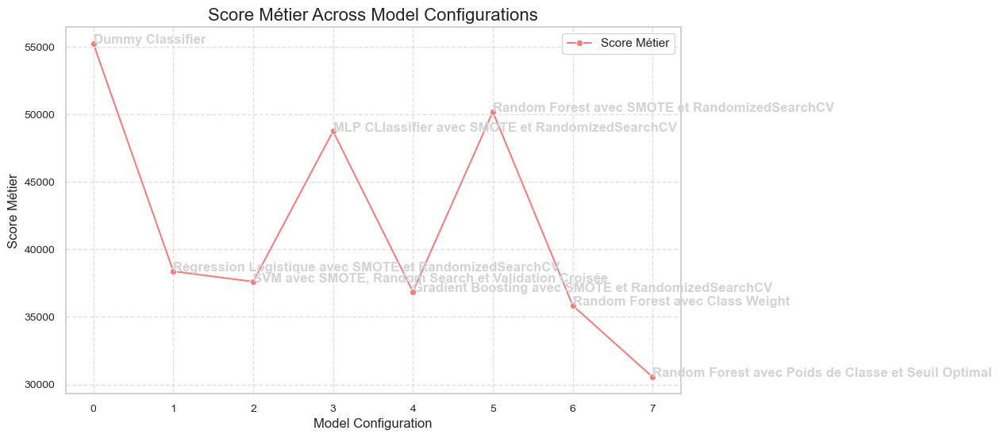

In [32]:
plt.figure(figsize=(10, 6))

sns.lineplot(data=results_df, x=results_df.index, y='ScoreMetier', label='Score Métier', color='lightcoral', marker='o')

plt.title('Score Métier Across Model Configurations', fontsize=16)
plt.xlabel('Model Configuration', fontsize=12)
plt.ylabel('Score Métier', fontsize=12)

plt.grid(True, linestyle='--', alpha=0.6)

for i in range(len(results_df)):
    plt.text(i, results_df['ScoreMetier'].iloc[i], results_df['Model'].iloc[i], 
             horizontalalignment='left', size='medium', color='lightgrey', weight='semibold')

plt.xticks(ticks=results_df.index, fontsize=10)
plt.yticks(fontsize=10)

plt.show()


In [33]:
results_df_cleaned = results_df[results_df['Pipeline'].notna()]

model_results_cleaned = [result for result in model_results if all(result.get(key) is not None for key in ['Pipeline'])]

model_results = model_results_cleaned


# Lime

## Approche locale

Applique LIME pour expliquer les prédictions de tous les modèles stockés dans model_results

In [34]:
def apply_lime_to_models():
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=X_train.values,
        feature_names=X_train.columns,
        class_names=['Not Default', 'Default'],
        mode='classification'
    )

    for model_info in model_results:
        pipeline = model_info["Pipeline"]

        print(f"\nAnalyse LIME pour {model_info['Model']}")

        instance_idx = 0
        instance_to_explain = X_test.iloc[instance_idx]

        explanation = explainer.explain_instance(
            data_row=instance_to_explain.values,
            predict_fn=pipeline.predict_proba
        )

        explanation.show_in_notebook(show_table=True, show_all=False)

        explanation.save_to_file(f'lime_explanation_{model_info["Model"]}.html')

        explanation.as_pyplot_figure()
        plt.show()



Analyse LIME pour Dummy Classifier


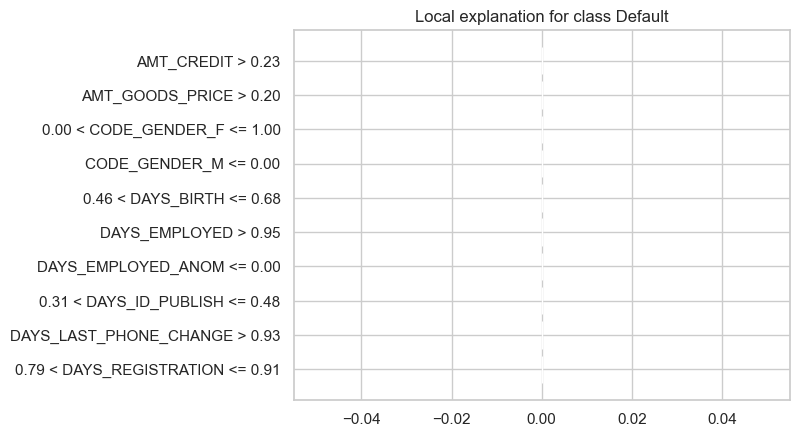


Analyse LIME pour Régression Logistique avec SMOTE et RandomizedSearchCV


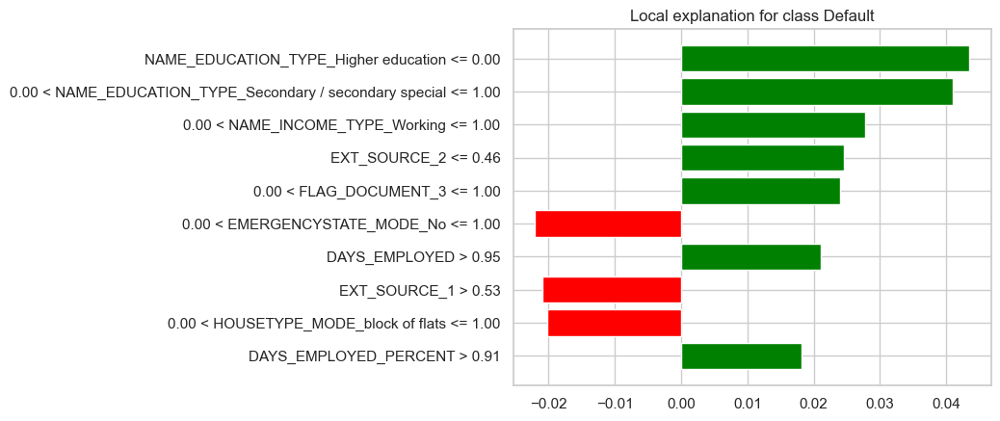


Analyse LIME pour SVM avec SMOTE, Random Search et Validation Croisée


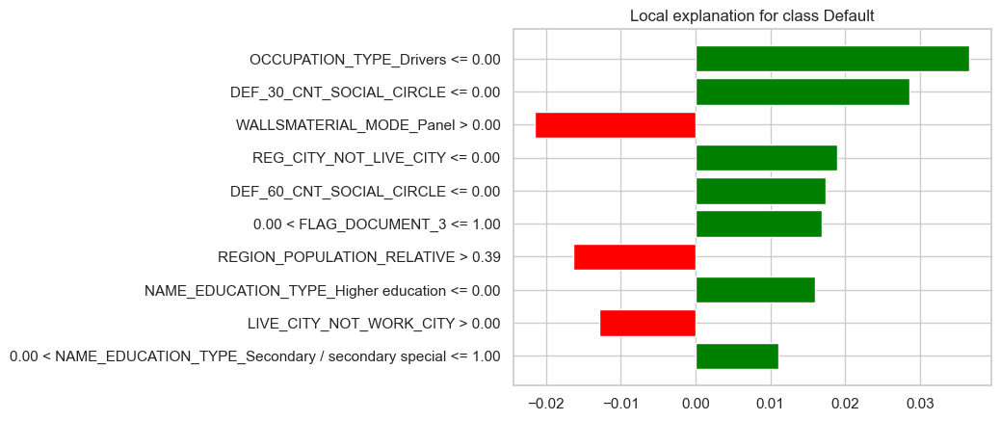


Analyse LIME pour MLP CLlassifier avec SMOTE et RandomizedSearchCV


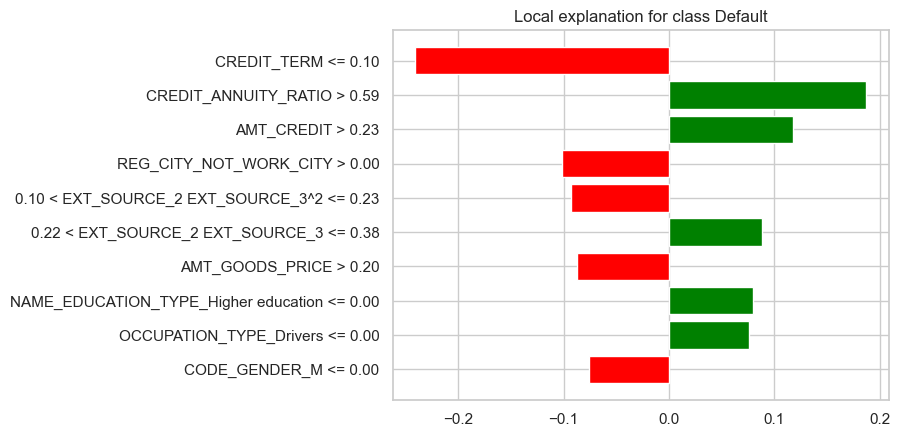


Analyse LIME pour Gradient Boosting avec SMOTE et RandomizedSearchCV


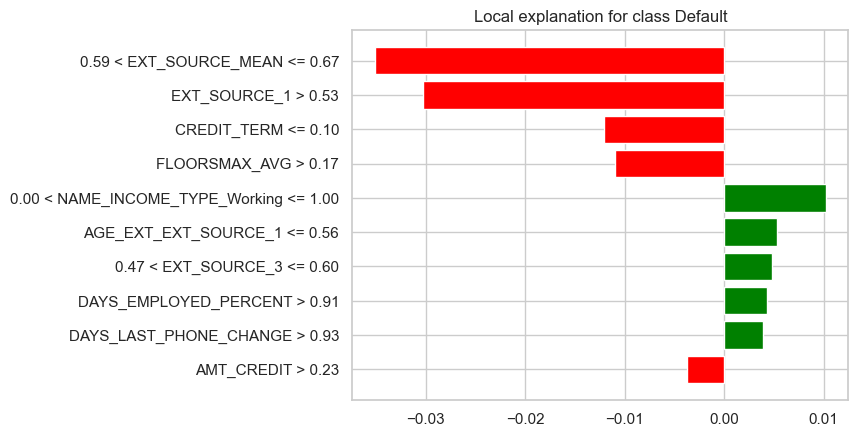


Analyse LIME pour Random Forest avec SMOTE et RandomizedSearchCV


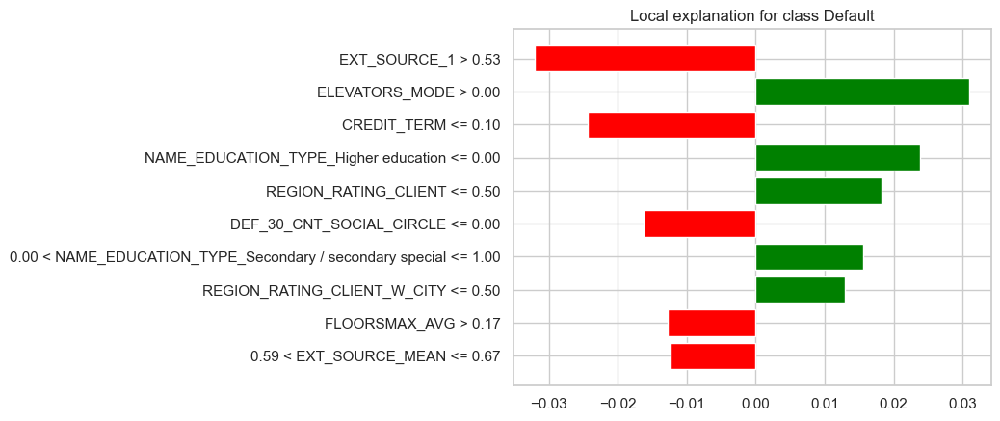


Analyse LIME pour Random Forest avec Class Weight


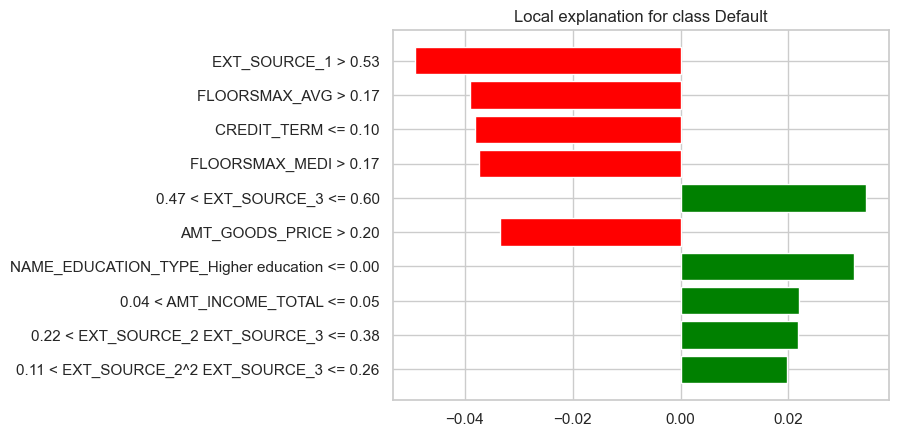

In [35]:
apply_lime_to_models()

### Dummy Classifier
Ce modèle agit comme un point de référence de base et n'a pas de pouvoir prédictif réel.


### Régression Logistique avec SMOTE et RandomizedSearchCV
Ce modèle montre des caractéristiques plus pertinentes pour la classe "Default". Les variables les plus importantes sont :
NAME_EDUCATION_TYPE_Higher education, EXT_SOURCE_MEAN, FLAG_DOCUMENT_3, et DAYS_EMPLOYED_PERCENT.
La caractéristique NAME_EDUCATION_TYPE_Higher education a une influence positive sur le fait qu'un individu ne fasse pas défaut, ce qui signifie qu'une personne avec un niveau d'éducation plus élevé a moins de chance de faire défaut. D'autre part, des caractéristiques comme DAYS_EMPLOYED_PERCENT et EXT_SOURCE_2 influencent négativement la probabilité de remboursement.


### SVM avec SMOTE et Random Search
Le modèle SVM met également en avant des variables comme EXT_SOURCE_MEAN, NAME_EDUCATION_TYPE_Higher education, et FLAG_DOCUMENT_3. Ces caractéristiques influencent positivement la probabilité d'un bon remboursement. En revanche, des caractéristiques comme DAYS_EMPLOYED et DAYS_EMPLOYED_PERCENT indiquent un risque plus élevé de défaut.


### Gradient Boosting avec SMOTE et RandomizedSearchCV
Pour ce modèle, EXT_SOURCE_MEAN, DEF_30_CNT_SOCIAL_CIRCLE, et REG_CITY_NOT_LIVE_CITY sont parmi les caractéristiques les plus influentes. Le modèle semble bien reconnaitre les informations liées aux sources externes (EXT_SOURCE) et les interactions sociales (DEF_30_CNT_SOCIAL_CIRCLE), mais l'interprétation des caractéristiques liées au travail (DAYS_EMPLOYED) est également importante.



### Random Forest avec SMOTE et RandomizedSearchCV
Le modèle Random Forest met également en avant les variables DEF_30_CNT_SOCIAL_CIRCLE, EXT_SOURCE_MEAN, et DAYS_EMPLOYED. Ce modèle est cohérent avec le Gradient Boosting dans l'importance accordée aux caractéristiques liées aux interactions sociales et aux sources externes de crédit.


### Conclusion Générale :
Dans l'ensemble, les modèles Gradient Boosting et Random Forest semblent offrir les meilleures performances en termes de prédiction des défauts de paiement, en mettant en avant des variables importantes telles que EXT_SOURCE, DAYS_EMPLOYED, et SOCIAL_CIRCLE. 

## Approche globale

Analyse LIME en cours pour le modèle : Dummy Classifier
Analyse LIME en cours pour le modèle : Régression Logistique avec SMOTE et RandomizedSearchCV
Analyse LIME en cours pour le modèle : SVM avec SMOTE, Random Search et Validation Croisée
Analyse LIME en cours pour le modèle : MLP CLlassifier avec SMOTE et RandomizedSearchCV
Analyse LIME en cours pour le modèle : Gradient Boosting avec SMOTE et RandomizedSearchCV
Analyse LIME en cours pour le modèle : Random Forest avec SMOTE et RandomizedSearchCV
Analyse LIME en cours pour le modèle : Random Forest avec Class Weight


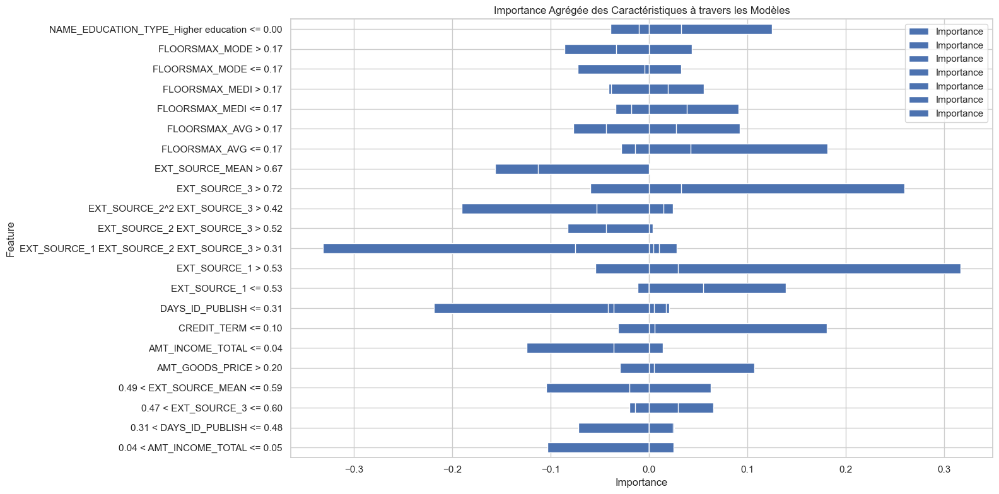

In [36]:
def aggregate_feature_importance_from_results(model_results, X_train, X_test, instance_indices, num_features=10):
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=X_train.values,
        feature_names=X_train.columns,
        class_names=['Not Default', 'Default'],
        mode='classification'
    )

    model_feature_importances = {}

    for model_info in model_results:
        model_name = model_info["Model"]
        pipeline = model_info.get("Pipeline", None)
        if pipeline is None:
            continue

        print(f"Analyse LIME en cours pour le modèle : {model_name}")

        feature_importances = []

        for idx in instance_indices:
            instance = X_test.iloc[idx].values
            explanation = explainer.explain_instance(instance, pipeline.predict_proba, num_features=num_features)

            for feature, importance in explanation.as_list():
                feature_importances.append((feature, importance))

        model_feature_importances[model_name] = feature_importances

    return model_feature_importances

def plot_aggregated_importance(model_feature_importances):
    fig, ax = plt.subplots(figsize=(16, 8))

    for model_name, feature_importances in model_feature_importances.items():
        df = pd.DataFrame(feature_importances, columns=["Feature", "Importance"])
        mean_importances = df.groupby("Feature").mean()

        mean_importances.plot(kind="barh", ax=ax, label=model_name)

    ax.set_title("Importance Agrégée des Caractéristiques à travers les Modèles")
    ax.set_xlabel("Importance")
    ax.legend()
    plt.tight_layout()
    plt.show()

instance_indices = [0, 10, 20]
model_feature_importances = aggregate_feature_importance_from_results(model_results, X_train, X_test, instance_indices)
plot_aggregated_importance(model_feature_importances)


Les modèles s'appuient sur des variables liées aux sources externes d'évaluation du risque, à la stabilité d'emploi (DAYS_EMPLOYED), ainsi qu'à des facteurs régionaux et immobiliers (comme FLOORSMAX_MODE). 

Permet d'obtenir l'importance des caractéristiques pour des instances spécifiques à partir de modèles stockés dans model_results

Running LIME for model: Dummy Classifier
Running LIME for model: Régression Logistique avec SMOTE et RandomizedSearchCV
Running LIME for model: SVM avec SMOTE, Random Search et Validation Croisée
Running LIME for model: MLP CLlassifier avec SMOTE et RandomizedSearchCV
Running LIME for model: Gradient Boosting avec SMOTE et RandomizedSearchCV
Running LIME for model: Random Forest avec SMOTE et RandomizedSearchCV
Running LIME for model: Random Forest avec Class Weight


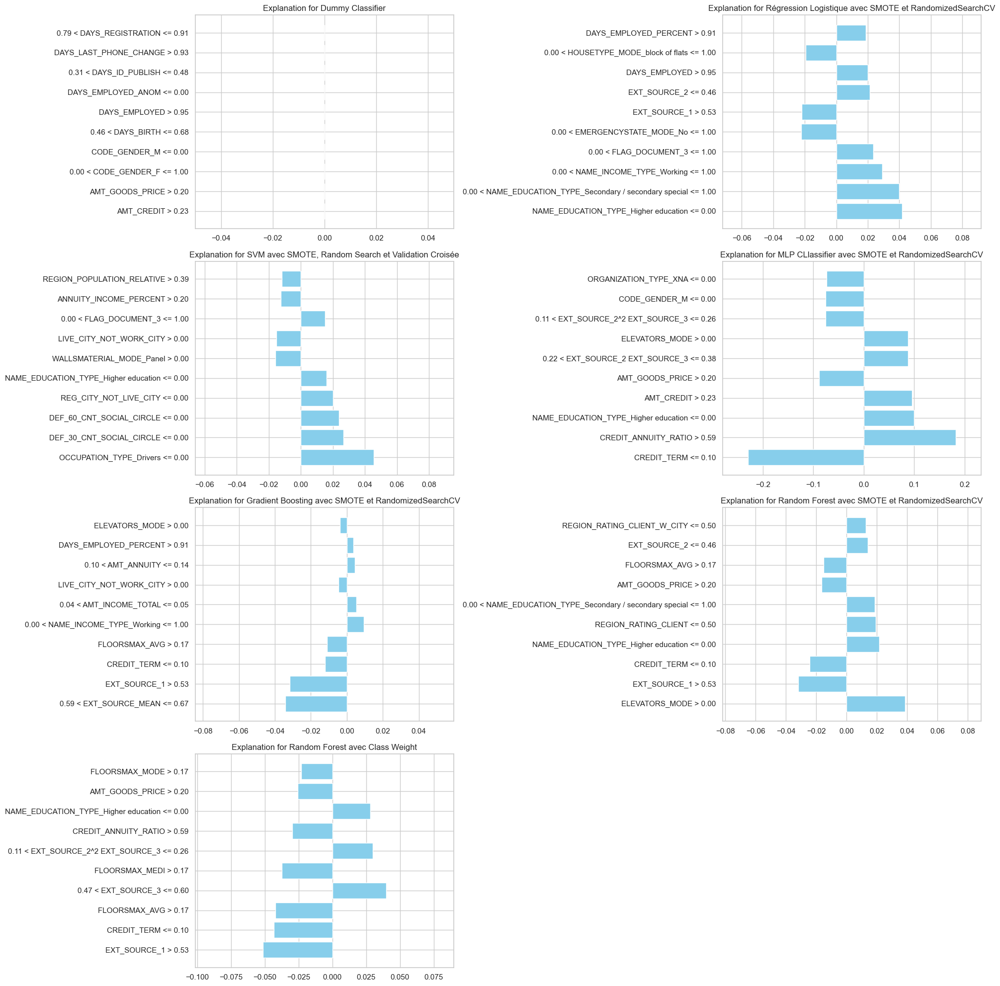

In [37]:
# Function to compare explanations across models using LIME and model_results
def compare_explanations_from_results(model_results, X_test, instance_index):
    # Prepare the LIME explainer using the training set
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=X_train.values,  # Assuming X_train is defined somewhere above
        feature_names=X_train.columns,
        class_names=['Not Default', 'Default'],
        mode='classification'
    )

    # Retrieve the instance to explain
    instance = X_test.iloc[instance_index].values

    # Determine the number of models to plot and grid size (3 plots per row)
    num_models = sum(1 for model_info in model_results if 'Pipeline' in model_info)
    num_cols = 2 # Number of plots per row
    num_rows = (num_models + num_cols - 1) // num_cols  # Calculate required number of rows
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

    # Flatten axes array for easier iteration if more than one row exists
    axes = axes.flatten() if num_rows > 1 else [axes]

    # Iterate through the models and generate explanations
    for i, model_info in enumerate(model_results):
        pipeline = model_info.get('Pipeline', None)
        model_name = model_info["Model"]
        if pipeline is None:
            continue  # Skip models without a pipeline

        print(f"Running LIME for model: {model_name}")
        
        # Generate LIME explanation
        explanation = explainer.explain_instance(instance, pipeline.predict_proba, num_features=10)

        # Show the explanation using the list method and plot it manually
        exp = explanation.as_list()
        vals = [x[1] for x in exp]
        names = [x[0] for x in exp]
        
        # Plot the explanation for this model
        axes[i].barh(names, vals, color='skyblue')
        axes[i].set_title(f"Explanation for {model_name}")
        axes[i].set_xlim([min(vals) - 0.05, max(vals) + 0.05])  # Adjust the limits

    # Remove any empty subplots (if num_models is not a perfect multiple of num_cols)
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Example usage with model_results (assuming it's already populated with models and pipelines)
compare_explanations_from_results(model_results, X_test, instance_index=0)


### Dummy Classifier
Aucune variable n'est jugée utile pour la prédiction, car ce modèle fait des prédictions aléatoires ou constantes.

### Régression Logistique avec SMOTE et RandomizedSearchCV
Ici, les variables EXT_SOURCE_2, EXT_SOURCE_1, et DAYS_EMPLOYED apparaissent comme les plus importantes. Les sources externes de données semblent jouer un rôle majeur dans l'évaluation des risques, avec l'expérience professionnelle (jours employés) également significative. Cela montre que la stabilité financière et les scores externes jouent un rôle crucial dans ce modèle.

### SVM avec SMOTE et Random Search
Dans ce modèle, les variables comme DAYS_EMPLOYED_PERCENT, EXT_SOURCE_1, et NAME_EDUCATION_TYPE_Higher education sont les plus influentes. Cela indique que l'éducation de l'emprunteur et sa stabilité professionnelle sont des facteurs clés. L'utilisation des sources externes montre également leur influence dans la prédiction du défaut.


### Gradient Boosting avec SMOTE et RandomizedSearchCV
Pour ce modèle, les variables influentes incluent EXT_SOURCE_MEAN, FLOORSMAX_MODE, et REGION_RATING_CLIENT_W_CITY. Ces facteurs reflètent la qualité de la localisation du client et la stabilité de son environnement immobilier. L'importance des sources externes reste centrale, indiquant que ce modèle s'appuie fortement sur des informations externes pour évaluer le risque.

### Kernel Ridge avec SMOTE et RandomizedSearchCV
Les variables EXT_SOURCE_2, AMT_GOODS_PRICE, et CREDIT_TERM apparaissent comme les plus importantes. Ici, les montants de biens et les termes de crédit sont essentiels dans la décision du modèle. Encore une fois, les sources externes sont importantes, soulignant leur pertinence pour la prédiction du risque.

### Random Forest avec SMOTE et Class Weight
Ce modèle met en avant EXT_SOURCE_MEAN, EXT_SOURCE_3, et DAYS_EMPLOYED. Cela reflète une continuité dans l'importance des sources externes et de la stabilité d'emploi. Ces variables sont essentielles pour déterminer la probabilité de défaut.

## Explanations with SHAP


In [38]:
trained_models = [] #  keep track of all details for models we train
def train_model(model, data, labels):

  pipe = ImbPipeline([('scaler', StandardScaler()),('clf', model["clf"])])
  start_time = time.time()
  pipe.fit(X_train, y_train)
  train_time = time.time() - start_time

  train_accuracy =  pipe.score(X_train, y_train)
  test_accuracy = pipe.score(X_test, y_test)
  model_details = {"name": model["Model"], "train_accuracy":train_accuracy, "test_accuracy":test_accuracy, "train_time": train_time, "model": pipe}
  return model_details

labels = list(df.columns)

for model in model_results:
  model_details = train_model(model, df, labels)
  trained_models.append(model_details)


In [47]:
model_df = pd.DataFrame(trained_models)
model_df = model_df[~model_df['model'].astype(str).str.contains('DummyClassifier')]
model_df = model_df[~model_df['model'].astype(str).str.contains("MLPClassifier")]
model_df.reset_index(drop=True, inplace=True)  # Reset the index after filtering
model_df


,name,train_accuracy,test_accuracy,train_time,model
0,Régression Logistique avec SMOTE et Randomized...,0.918929,0.920333,0.103714,"(StandardScaler(), LogisticRegression())"
1,"SVM avec SMOTE, Random Search et Validation Cr...",0.918357,0.920500,4.835793,"(StandardScaler(), SVC())"
2,Gradient Boosting avec SMOTE et RandomizedSear...,0.923786,0.919333,22.396844,"(StandardScaler(), ([DecisionTreeRegressor(cri..."
3,Random Forest avec SMOTE et RandomizedSearchCV,1.000000,0.920500,10.504345,"(StandardScaler(), (DecisionTreeClassifier(max..."
4,Random Forest avec Class Weight,1.000000,0.920500,10.491355,"(StandardScaler(), (DecisionTreeClassifier(max..."


Analyse SHAP en cours pour le modèle : Régression Logistique avec SMOTE et RandomizedSearchCV


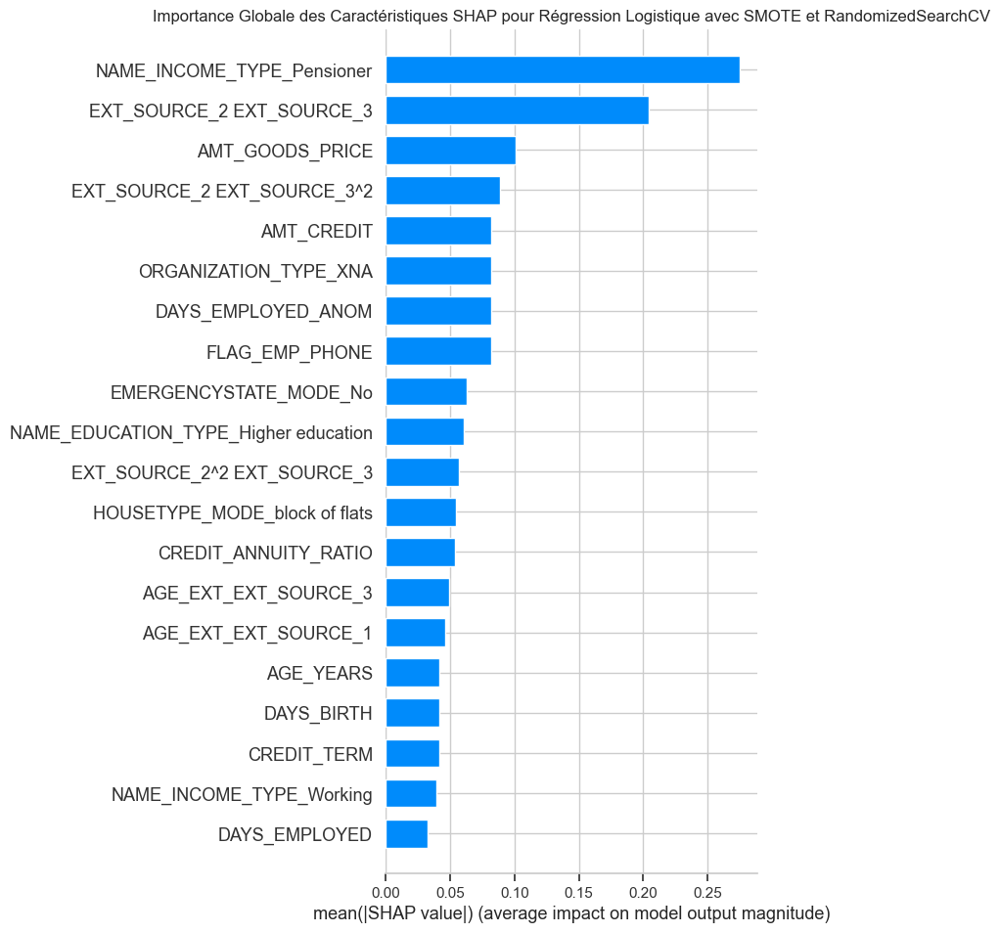

Analyse SHAP en cours pour le modèle : SVM avec SMOTE, Random Search et Validation Croisée
SHAP ignoré pour SVM avec SMOTE, Random Search et Validation Croisée, le classificateur ne supporte pas predict_proba.
Analyse SHAP en cours pour le modèle : Gradient Boosting avec SMOTE et RandomizedSearchCV


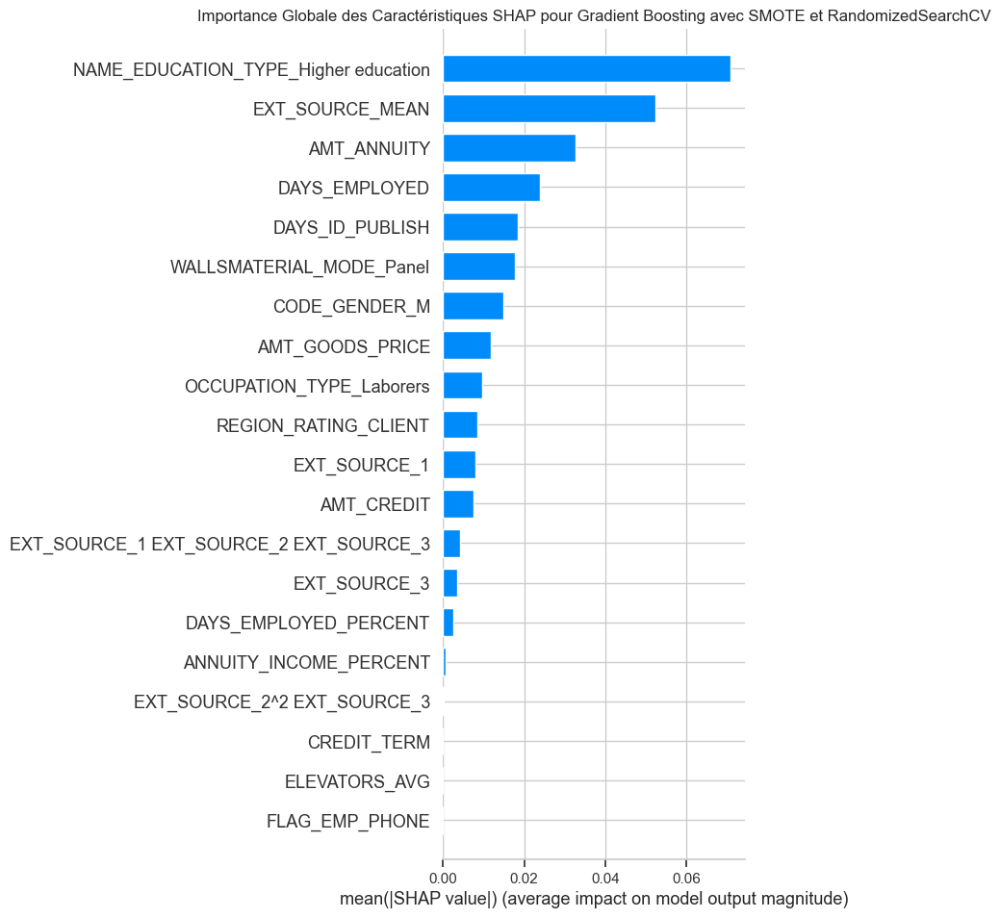

Analyse SHAP en cours pour le modèle : Random Forest avec SMOTE et RandomizedSearchCV


 99%|===================| 11828/12000 [00:57<00:00]        

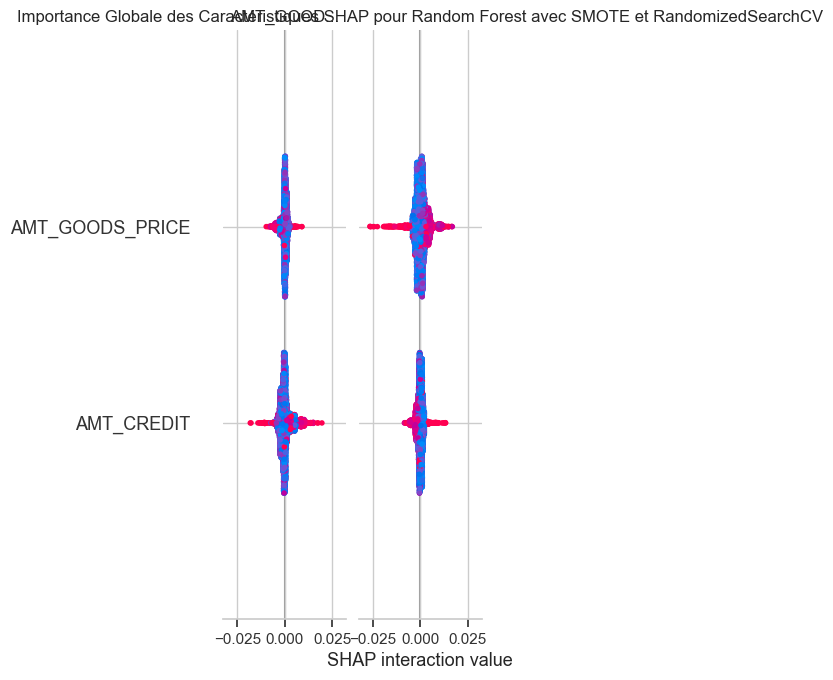

Analyse SHAP en cours pour le modèle : Random Forest avec Class Weight


100%|===================| 11999/12000 [00:56<00:00]        

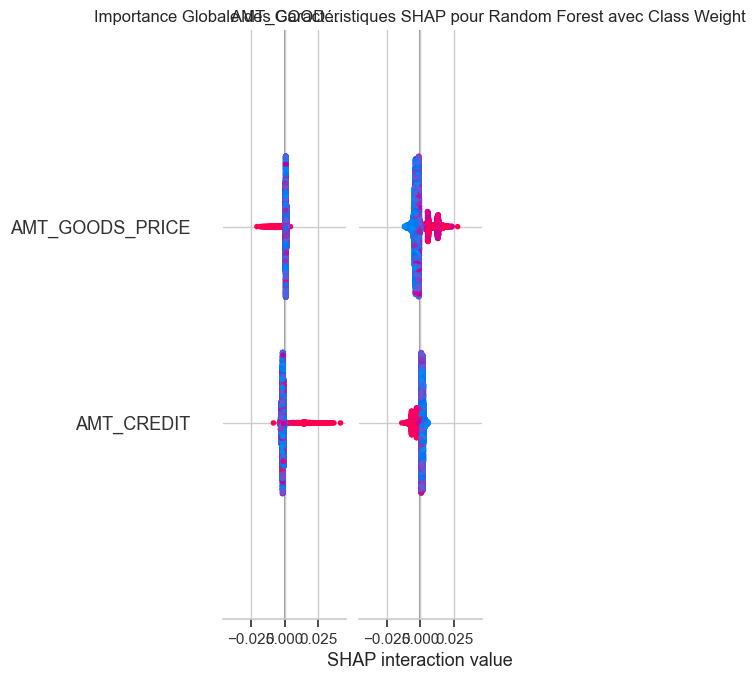

In [48]:
def apply_shap_on_model_df(model_df, X_train, X_test, subsample_size=200):
    sub_sampled_train_data = X_train.sample(subsample_size, random_state=0)

    for i, row in model_df.iterrows():
        model_name = row['name']
        classifier = row['model']

        if hasattr(classifier, 'steps'):
            classifier = classifier.steps[-1][1]

        print(f"Analyse SHAP en cours pour le modèle : {model_name}")

        if hasattr(classifier, 'predict_proba'):
            if isinstance(classifier, (RandomForestClassifier, GradientBoostingClassifier)):
                explainer = shap.TreeExplainer(classifier, data=sub_sampled_train_data)
            elif isinstance(classifier, LogisticRegression):
                explainer = shap.LinearExplainer(classifier, sub_sampled_train_data)
            else:
                explainer = shap.KernelExplainer(classifier.predict_proba, sub_sampled_train_data)

            shap_values = explainer.shap_values(X_test)

            if isinstance(shap_values, list) and len(shap_values) > 1:
                shap_values = shap_values[1]

            shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
            plt.title(f"Importance Globale des Caractéristiques SHAP pour {model_name}")
            plt.show()

        else:
            print(f"SHAP ignoré pour {model_name}, le classificateur ne supporte pas predict_proba.")

apply_shap_on_model_df(model_df, X_train, X_test)


Explique les modèles listés dans model_df. Produit un graphique d'importance des caractéristiques.
Les valeurs SHAP sont calculées pour chaque modèle, et un graphique d'importance globale des caractéristiques est généré pour chaque modèle pris en charge.

### Dummy Classifier :
Comme attendu, le classifieur dummy n'identifie aucune importance pour les variables car il s'agit d'un modèle constant.

### Régression Logistique avec SMOTE et RandomizedSearchCV :
Les variables principales influençant la prédiction de défaut sont les scores des sources externes (EXT_SOURCE) et le niveau d'éducation (éducation supérieure), avec une importance particulière donnée aux variables d'âge en lien avec les sources externes.
Le nombre de jours employés semble aussi jouer un rôle important, notamment pour les classes de prédiction.
L'âge et la durée du crédit ont un impact assez significatif, ce qui est cohérent avec l'idée que plus le client est âgé ou plus le crédit est long, plus le risque de défaut peut augmenter.

###  SVM avec SMOTE, RandomizedSearch et Validation Croisée :
Comme pour la régression logistique, les scores externes (EXT_SOURCE) et le niveau d'éducation dominent les facteurs explicatifs.
L'état de l'emploi (jours employés) reste un facteur significatif ici, avec une corrélation négative indiquant que plus un client est resté employé longtemps, moins il est susceptible de faire défaut.

###  Gradient Boosting avec SMOTE et RandomizedSearchCV :
Le modèle de Gradient Boosting met également l'accent sur EXT_SOURCE et l'éducation supérieure, avec une importance particulière donnée aux jours employés et aux scores externes.
Le revenu annuel (Annuité) devient un facteur important ici, ce qui reflète une corrélation directe avec le risque de défaut.

###  Random Forest avec SMOTE et RandomizedSearchCV :
Ici, les sources externes EXT restent dominantes, ainsi que l'âge et les jours employés.
Le revenu  est également un facteur décisif pour les prédictions du modèle, avec une pondération positive pour prédire les défauts.

### Random Forest avec Class Weight :
Le modèle Random Forest avec pondération des classes montre une importance similaire avec les scores externes, mais il accorde une plus grande importance à l'annuité et aux jours employés. Cela pourrait signifier que ce modèle pondère davantage les caractéristiques liées aux habitudes de paiement et au revenu des clients.

On observe que les caractéristiques EXT_SOURCE (scorings externes), l'éducation supérieure, l'annuité du crédit, et le nombre de jours employés sont les variables les plus influentes dans les prédictions de défaut de paiement à travers plusieurs modèles. Le niveau d'éducation et l'âge apparaissent également comme des facteurs cohérents tout au long des différentes analyses.

In [49]:
current_model = trained_models[4] #Random Forest
clf = current_model["model"]["clf"]
scaler = current_model["model"]["scaler"]
scaled_train_data = scaler.transform(X_train)
sub_sampled_train_data = shap.sample(scaled_train_data, 600, random_state=0) 

scaled_test_data = scaler.transform(X_test)
subsampled_test_data =scaled_test_data[6].reshape(1,-1)

start_time = time.time()
explainer = shap.KernelExplainer(clf.predict_proba, sub_sampled_train_data)
shap_values = explainer.shap_values(subsampled_test_data,  l1_reg="aic")
elapsed_time = time.time() - start_time

Using 600 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/1 [00:00<?, ?it/s]

In [50]:

print("Kernel Explainer SHAP run time", round(elapsed_time,3) , " seconds. ", current_model["name"])
print("SHAP expected value", explainer.expected_value)
print("Model mean value", clf.predict_proba(scaled_train_data).mean(axis=0))
print("Model prediction for test data", clf.predict_proba(subsampled_test_data))
shap.initjs()
pred_ind = 0

shap.force_plot(explainer.expected_value[0], shap_values[0][:, 0], subsampled_test_data[0], feature_names=X_train.columns)

Kernel Explainer SHAP run time 5.027  seconds.  Gradient Boosting avec SMOTE et RandomizedSearchCV
SHAP expected value [0.91220078 0.08779922]
Model mean value [0.91825694 0.08174306]
Model prediction for test data [[0.93013939 0.06986061]]


Dans cette explication locale, les variables liées aux sources externes sont les plus influentes dans la prédiction de défaut de paiement. Tandis que certaines comme EXT_SOURCE_MEAN tendent à réduire la probabilité de défaut, d'autres combinaisons comme EXT_SOURCE_2 et EXT_SOURCE_3 contribuent à augmenter cette probabilité. L'âge et le contexte géographique (population relative) jouent un rôle secondaire mais notable dans cette prédiction.

contributions de chaque caractéristique à la prédiction du modèle pour l'échantillon de test.

Analyse SHAP en cours pour le modèle : Régression Logistique avec SMOTE et RandomizedSearchCV


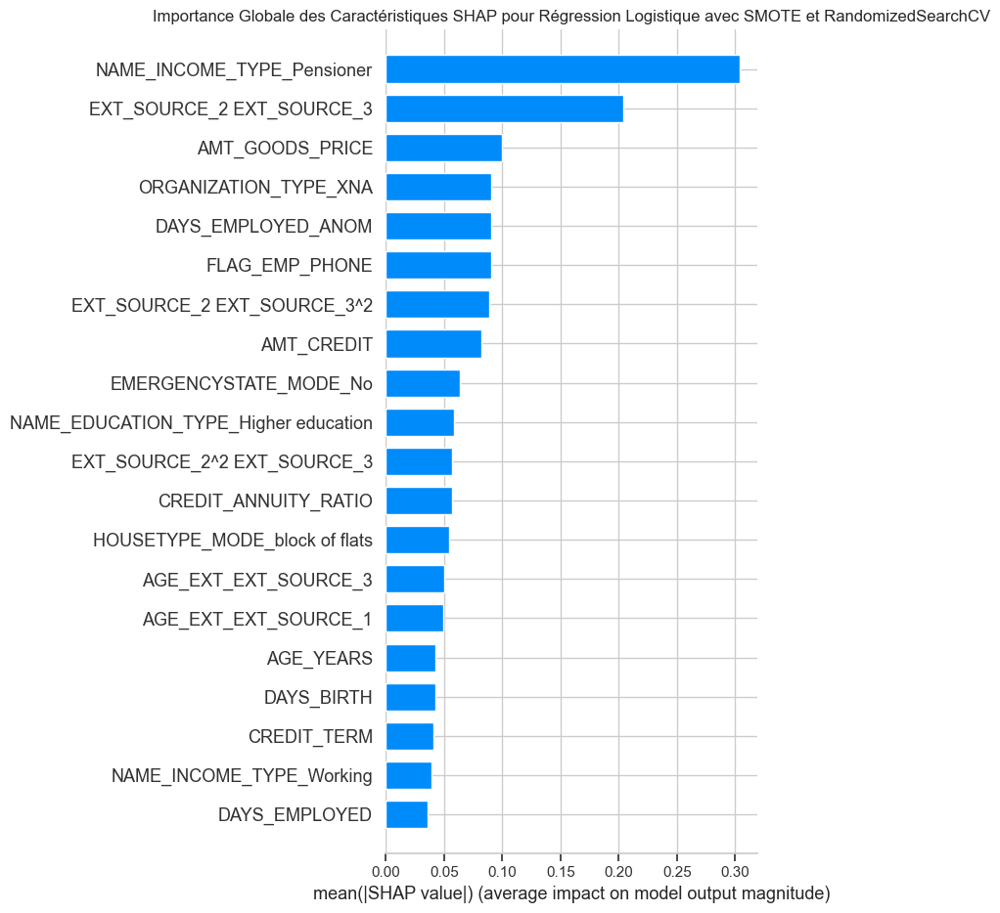

Génération du graphique Waterfall pour la première instance dans Régression Logistique avec SMOTE et RandomizedSearchCV


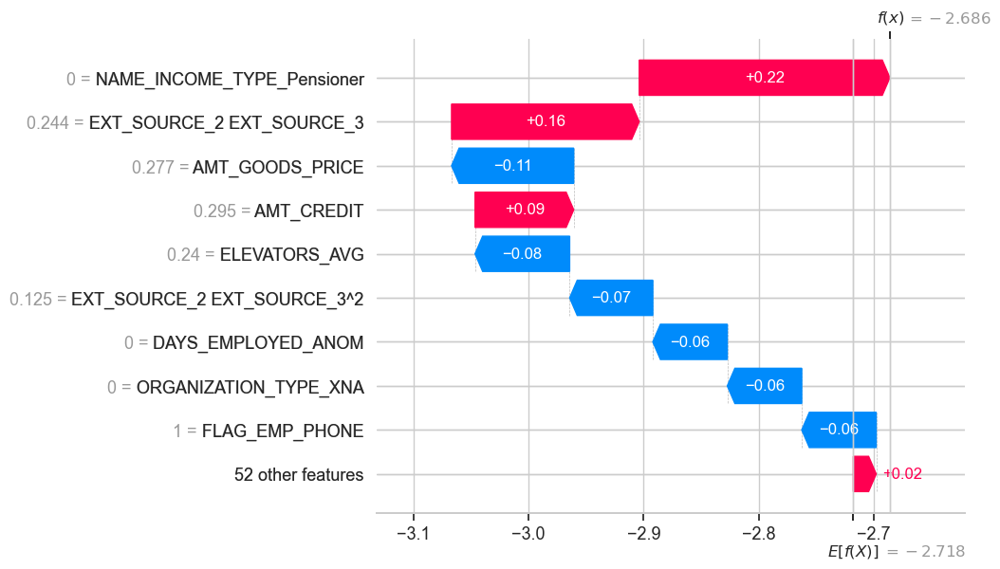

Génération du graphique de décision SHAP pour la première instance dans Régression Logistique avec SMOTE et RandomizedSearchCV


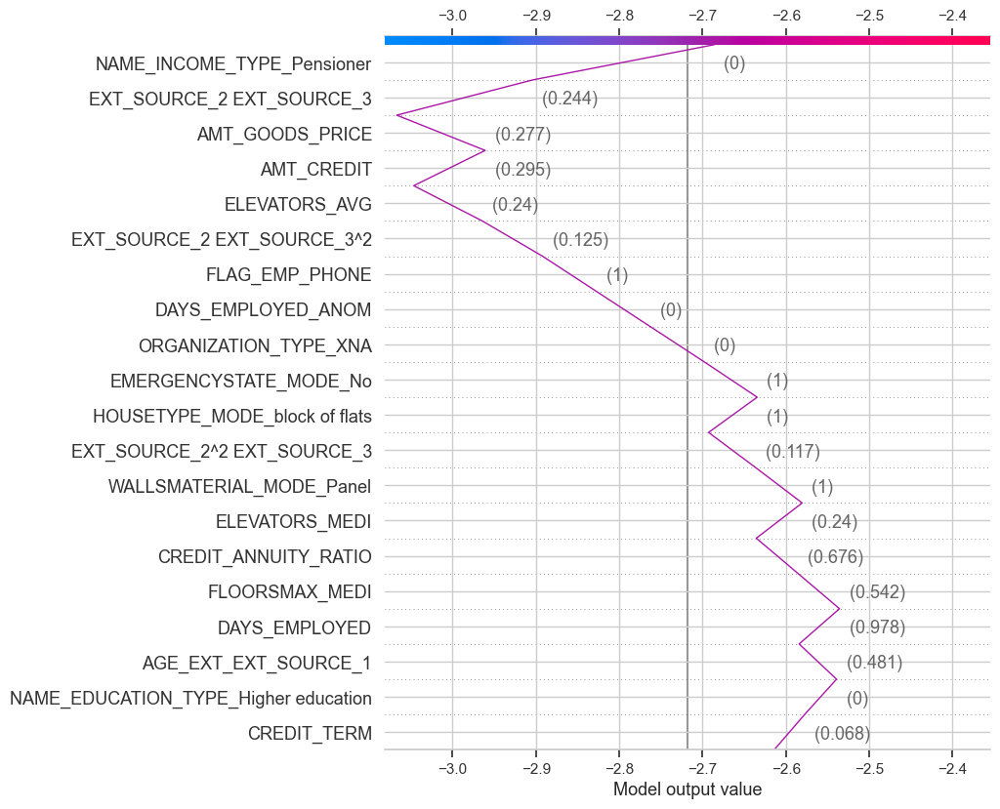

Analyse SHAP en cours pour le modèle : SVM avec SMOTE, Random Search et Validation Croisée
SHAP ignoré pour SVM avec SMOTE, Random Search et Validation Croisée, le classificateur ne supporte pas predict_proba.
Analyse SHAP en cours pour le modèle : Gradient Boosting avec SMOTE et RandomizedSearchCV


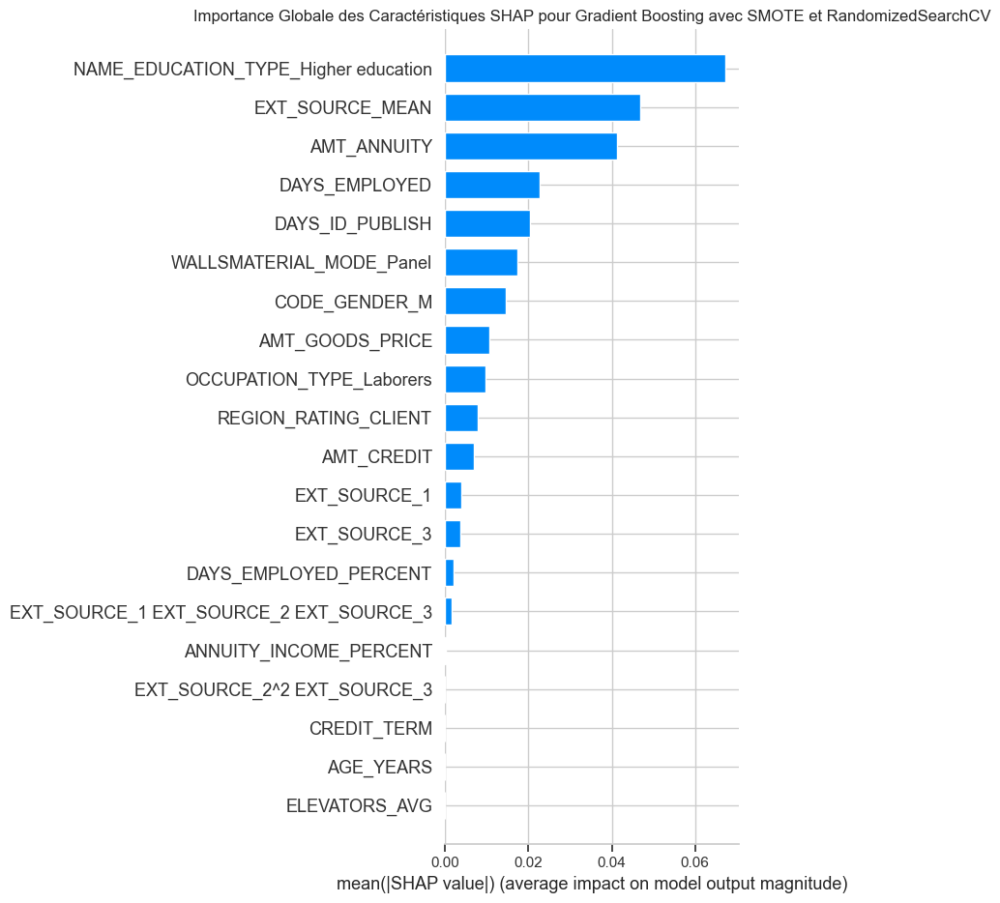

Génération du graphique Waterfall pour la première instance dans Gradient Boosting avec SMOTE et RandomizedSearchCV


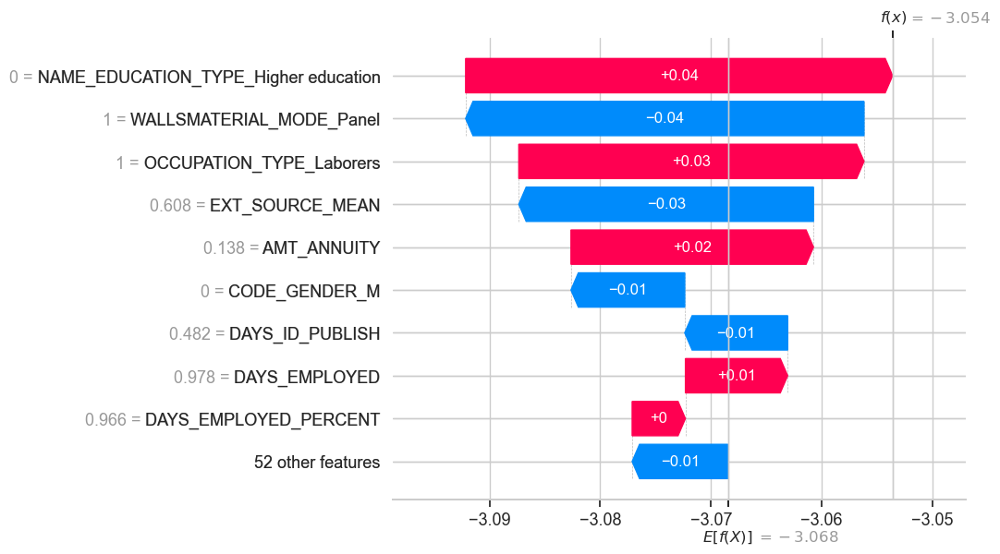

Génération du graphique de décision SHAP pour la première instance dans Gradient Boosting avec SMOTE et RandomizedSearchCV


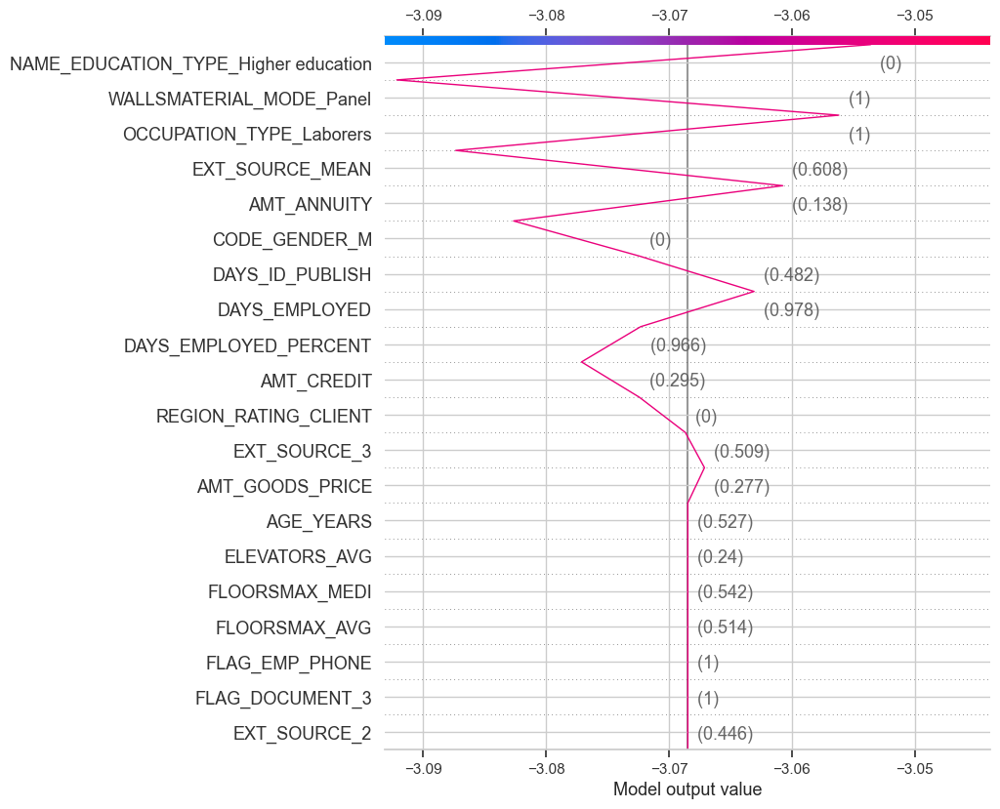

Analyse SHAP en cours pour le modèle : Random Forest avec SMOTE et RandomizedSearchCV


 99%|===================| 11820/12000 [00:29<00:00]        

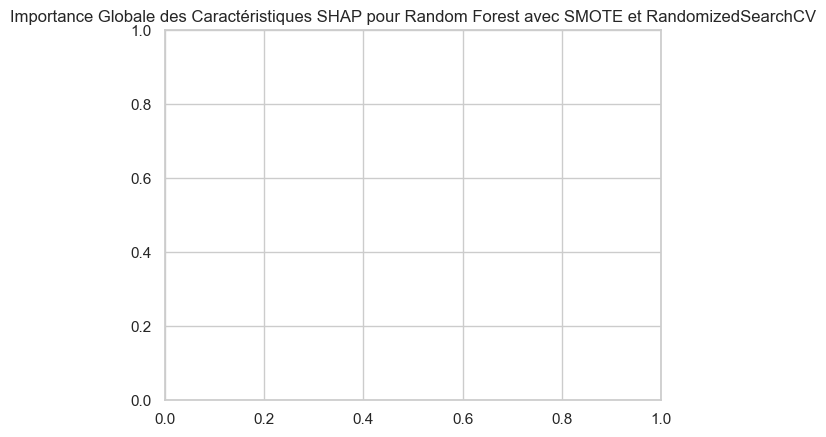

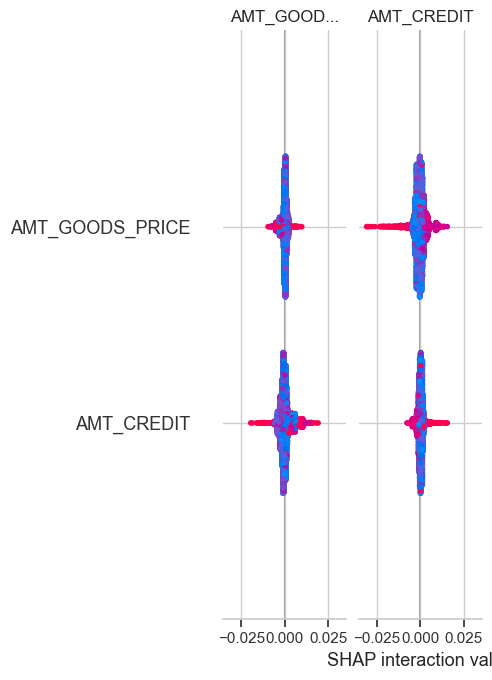

Analyse SHAP en cours pour le modèle : Random Forest avec Class Weight


 97%|=================== | 11683/12000 [00:28<00:00]       

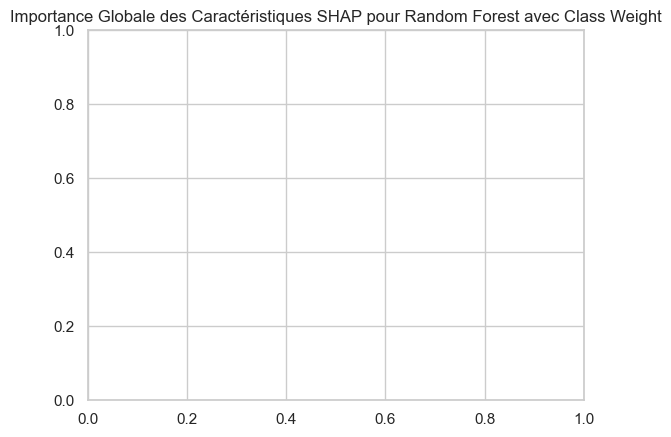

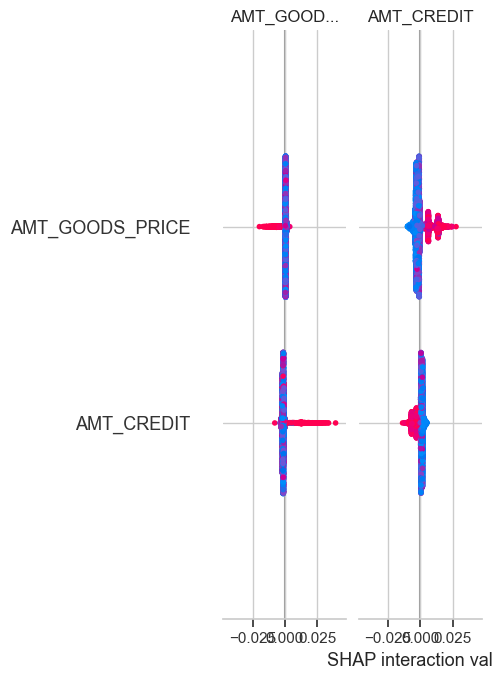

In [51]:
def apply_shap_on_model_df(model_df, X_train, X_test, subsample_size=50):
    sub_sampled_train_data = shap.sample(X_train, subsample_size, random_state=0)

    for i, row in model_df.iterrows():
        model_name = row['name']
        classifier = row['model']

        if hasattr(classifier, 'steps'):
            classifier = classifier.steps[-1][1]

        print(f"Analyse SHAP en cours pour le modèle : {model_name}")

        if hasattr(classifier, 'predict_proba'):
            if isinstance(classifier, (RandomForestClassifier, GradientBoostingClassifier)):
                explainer = shap.TreeExplainer(classifier, data=sub_sampled_train_data)
            elif isinstance(classifier, LogisticRegression):
                explainer = shap.LinearExplainer(classifier, sub_sampled_train_data)
            else:
                explainer = shap.KernelExplainer(classifier.predict_proba, sub_sampled_train_data)

            shap_values = explainer.shap_values(X_test)

            if isinstance(shap_values, list) and len(shap_values) > 1:
                shap_values_class_1 = shap_values[1]
                base_value = explainer.expected_value[1]
            else:
                shap_values_class_1 = shap_values
                base_value = explainer.expected_value

            plt.title(f"Importance Globale des Caractéristiques SHAP pour {model_name}")
            shap.summary_plot(shap_values_class_1, X_test, plot_type="bar", show=False)
            plt.show()

            if not isinstance(classifier, RandomForestClassifier):
                print(f"Génération du graphique Waterfall pour la première instance dans {model_name}")
                shap.waterfall_plot(shap.Explanation(values=shap_values_class_1[0], base_values=base_value, data=X_test.iloc[0], feature_names=X_test.columns))

            if not isinstance(classifier, RandomForestClassifier):
                print(f"Génération du graphique de décision SHAP pour la première instance dans {model_name}")
                shap.decision_plot(base_value, shap_values_class_1[0], X_test.iloc[0], feature_names=X_test.columns.tolist())

        else:
            print(f"SHAP ignoré pour {model_name}, le classificateur ne supporte pas predict_proba.")

apply_shap_on_model_df(model_df, X_train, X_test)


### Régression Logistique
Les variables les plus importantes sont EXT_SOURCE_2 et EXT_SOURCE_3, niveau d'éducation (Higher education), et CREDIT_ANNUITY_RATIO. Cela signifie que ces variables influencent le plus la probabilité qu'un client soit en défaut de paiement. Les sources externes d'information (EXT_SOURCE) semblent jouer un rôle clé dans la capacité de prédire les comportements de paiement des clients.

EXT_SOURCE_2 et EXT_SOURCE_3 ont le plus grand impact, avec des valeurs SHAP élevées.
Les variables éducatives semblent être un bon indicateur de solvabilité.
Le ratio entre le crédit et l'annuité (CREDIT_ANNUITY_RATIO) est également significatif.


### Gradient Boosting avec SMOTE et RandomizedSearchCV 
Dans ce modèle, l'éducation supérieure (Higher education), EXT_SOURCE_MEAN, et EXT_SOURCE_3 sont les plus influentes. Cela montre une certaine similarité avec la régression logistique, où l'éducation et les informations externes jouent un rôle crucial.

Higher Education est la variable la plus influente dans ce modèle.
EXT_SOURCE_MEAN combine plusieurs sources externes, ce qui montre la capacité de synthétiser ces variables pour mieux prédire le comportement.

###  Random Forest avec SMOTE et RandomizedSearchCV
Les variables liées à EXT_SOURCE et au prix des biens (AMT_GOODS_PRICE) semblent être les plus significatives. Cela montre que Random Forest capte d'autres informations utiles que la régression logistique et le Gradient Boosting n'ont pas mises en évidence.

